# Распознавание игровых карт в приложении

<hr style="border: 1px solid rgba(50, 50, 255, 0.5); width: 100%;">

Специалист:  
**Вольхин Д.Ф.**

Email:  
[dfvolkhin@edu.hse.ru](mailto:dfvolkhin@edu.hse.ru)

Дата:  
**08 февраля 2025**

<hr style="border: 1px solid rgba(50, 50, 255, 0.5); width: 100%;">

## ANSI коды для цветов текста

In [1]:
RED = "\033[31m"
GREEN = "\033[32m"
YELLOW = "\033[33m"
BLUE = "\033[34m"
RESET = "\033[0m"  # сброс цветов до стандартных

## Шаблоны markdown

<span style="color: green;"># Это комментарий в коде</span><br>
<span style="color: blue;">def</span> greet(name):<br>
<span style="color: red;">print</span>(f"Hello, {name}!")
<hr style="border: 1px solid rgba(50, 50, 255, 0.5); width: 100%;">
<pre style="background-color: #F5F5F5; padding: 10px; border-radius: 5px; font-family: monospace;">code</pre>

## Установка библиотек (опционально)

In [2]:
# !pip install torch==1.12.1+cu116 torchvision==0.13.1+cu116 --index-url https://download.pytorch.org/whl/cu116
# !pip install tensorboard==2.10.1 tensorflow==2.10.0
# !pip install pydantic==2.10.3
# !pip install tqdm==4.66.2
# !pip install scikit-learn==1.5.1
# !pip install scipy==1.13.1
# !pip install seaborn==0.13.2
# !pip install rich==13.7.1
# !pip install requests==2.32.3
# !pip install pillow==10.4.0
# !pip install pandas==2.2.2
# !pip install matplotlib==3.9.2
# !pip install duckdb==1.1.0
# !pip install annotated-types==0.7.0

# Подготовка к написанию кода

## Импорт библиотек

In [4]:
print(f"{YELLOW}"+60*"-"+f"{RESET}")
print(f"Библиотеки: \n")

# Дополнительные библиотеки
import platform # Узнать версию пайтона ;)
import os
import logging
import time
import sys
import random
import re
import shutil
from tqdm import tqdm
from functools import wraps
from typing import Any, Tuple, Union, Optional, List, Type, Callable, Dict
from collections import Counter
import zipfile
from dataclasses import dataclass
import yaml
from glob import glob
from pathlib import Path
import random
import hashlib

# Основные библиотеки
import IPython.display as ipd # Добавляет виджеты для ячеек юпитера
from IPython import get_ipython
import ipykernel
print(f"python: {BLUE}{platform.python_version()}{RESET} ")
import matplotlib # Для рисунков
import matplotlib.pyplot as plt
print(f"matplotlib: {BLUE}{matplotlib.__version__}{RESET}")
import numpy as np # Для работы с массивами
print(f"numpy: {BLUE}{np.__version__}{RESET}")
import pandas as pd # Работа с таблицами
print(f"pandas: {BLUE}{pd.__version__}{RESET}")
import sklearn # Много полезного для ML
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
print(f"sklearn: {BLUE}{sklearn.__version__}{RESET}")
import scipy
print(f"scipy: {BLUE}{scipy.__version__}{RESET}")
import pydantic # Для валидации данных
from pydantic import (BaseModel, Field, StrictStr, condecimal, StrictInt, StrictBool,
                      FilePath, DirectoryPath, ValidationError, root_validator, ConfigDict)
print(f"pydantic: {BLUE}{pydantic.__version__}{RESET}")
import fastapi
from fastapi import HTTPException, status
print(f"fastapi: {BLUE}{fastapi.__version__}{RESET}")
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import DataLoader, Subset, WeightedRandomSampler
print(f"torch: {BLUE}{torch.__version__}{RESET}")
import torchvision
from torchvision import datasets
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
import torchvision.models as models
from torchvision.ops import box_iou
print(f"torchvision: {BLUE}{torchvision.__version__}{RESET}")
import requests
print(f"requests: {BLUE}{requests.__version__}{RESET}")
import PIL
from PIL import Image
print(f"pillow: {BLUE}{PIL.__version__}{RESET}")
import ultralytics
from ultralytics import YOLO
print(f"ultralytics: {BLUE}{ultralytics.__version__}{RESET}")
from roboflow import Roboflow
import cv2
print(f"opencv: {BLUE}{cv2.__version__}{RESET}")
import seaborn as sns
print(f"seaborn: {BLUE}{sns.__version__}{RESET}")
import albumentations as A
print(f"albumentations: {BLUE}{A.__version__}{RESET}")


from rich.theme import Theme
from rich.logging import RichHandler
from rich.console import Console
from rich.pretty import install as pretty_install
from rich.traceback import install as traceback_install


print(f"{YELLOW}"+60*"-"+f"{RESET}")

------------------------------------------------------------
Библиотеки: 

python: 3.10.12 
matplotlib: 3.10.1
numpy: 1.26.0
pandas: 2.2.3
sklearn: 1.6.1
scipy: 1.15.2
pydantic: 2.11.3
fastapi: 0.115.12
torch: 1.12.1+cu116
torchvision: 0.13.1+cu116
requests: 2.32.3
pillow: 11.0.0
ultralytics: 8.3.104
opencv: 4.10.0
seaborn: 0.13.2
albumentations: 2.0.5
------------------------------------------------------------


## Дополнительные настройки

In [5]:
import warnings
warnings.filterwarnings("ignore")
import logging
# Отключение логирования для cmdstanpy
logging.getLogger('cmdstanpy').setLevel(logging.ERROR)
# Полезна при разработке собственных библиотек, юпитер будет переимпортировать модули, если в них были изменения
%load_ext autoreload
%autoreload 1

## Кастомный setup_logging

In [6]:
log = None

def setup_logging(clean=False, debug=False):
    global log

    if log is not None:
        return log

    try:
        if clean and os.path.isfile('setup.log'):
            os.remove('setup.log')
        time.sleep(0.1)  # prevent race condition
    except:
        pass

    if sys.version_info >= (3, 9):
        logging.basicConfig(level=logging.DEBUG, format='%(asctime)s | %(levelname)s | %(pathname)s | %(message)s',
                            filename='setup.log', filemode='a', encoding='utf-8', force=True)
    else:
        logging.basicConfig(level=logging.DEBUG, format='%(asctime)s | %(levelname)s | %(pathname)s | %(message)s',
                            filename='setup.log', filemode='a', force=True)

    console = Console(log_time=True, log_time_format='%H:%M:%S-%f', theme=Theme({
        "traceback.border": "black",
        "traceback.border.syntax_error": "black",
        "inspect.value.border": "black",
    }))
    pretty_install(console=console)
    traceback_install(console=console, extra_lines=1, width=console.width, word_wrap=False, indent_guides=False,
                      suppress=[])
    rh = RichHandler(show_time=True, omit_repeated_times=False, show_level=True, show_path=False, markup=False,
                     rich_tracebacks=True, log_time_format='%H:%M:%S-%f',
                     level=logging.DEBUG if debug else logging.INFO, console=console)
    rh.set_name(logging.DEBUG if debug else logging.INFO)
    log = logging.getLogger("sd")
    log.addHandler(rh)

    return log

In [7]:
log = setup_logging()

## Валидация входящих данных для каждого класса

### validate_with_pydantic

In [8]:
def validate_with_pydantic(model_cls):
    """
    Декоратор для валидации данных с использованием Pydantic-модели.
    """

    def decorator(func):
        @wraps(func)
        def wrapper(*args, **kwargs):
            # Проверяем данные в аргументах функции
            try:
                data = kwargs.get("entry", args[0] if args else None)
                if not data:
                    raise HTTPException(status_code=status.HTTP_400_BAD_REQUEST,
                                        detail="No data provided for validation.")
                # Валидация данных
                if isinstance(data, BaseModel):
                    data = data.dict(by_alias=True)
                validated_data = model_cls(**data)
                # Передаем валидированные данные дальше
                kwargs["entry"] = validated_data
                return func(*args, **kwargs)
            except ValidationError as ve:
                log.exception("Validation failed", exc_info=ve)
                raise HTTPException(status_code=status.HTTP_400_BAD_REQUEST,
                                    detail="Invalid data for Pydantic model.") from ve

        return wrapper

    return decorator

### auto_generate_docstring

In [9]:
def auto_generate_docstring(cls: Type[BaseModel]) -> Type[BaseModel]:
    """
    Декоратор для автоматического добавления docstring в классы Pydantic.
    """

    def generate_docstring(model: Type[BaseModel]) -> str:
        """
        Генерация строки документации из описания полей модели Pydantic.
        """
        docstring = []
        for field_name, field_info in model.__fields__.items():
            field_details = f"Field '{field_name}':\n"
            if field_info.description:  # Получение описания
                field_details += f"  Description: {field_info.description}\n"
            if field_info.examples:  # Получение примеров
                field_details += f"  Examples: {field_info.examples}\n"
            docstring.append(field_details)
        return "\n".join(docstring)

    # Добавляем описание к существующему docstring
    cls.__doc__ = (cls.__doc__ or "") + "\n\n" + generate_docstring(cls)
    return cls

### EntryRoboflowDatasetDownloader

In [10]:
@auto_generate_docstring
class EntryRoboflowDatasetDownloader(BaseModel):
    """
    Класс для валидации входных данных конфигурации загрузки датасета из Roboflow
    """
    model_config = ConfigDict(arbitrary_types_allowed=True)
    
    ApiKey: StrictStr = Field(...,
                             alias="api_key",
                             examples=["7fwRxe7BbpO6YkhH7dW7"],
                             description="API ключ для доступа к Roboflow")
    
    Workspace: StrictStr = Field(...,
                                alias="workspace",
                                examples=["alexandre-b2d69"],
                                description="Название рабочего пространства в Roboflow")
    
    ProjectName: StrictStr = Field(...,
                                  alias="project_name",
                                  examples=["first-ugfem"],
                                  description="Название проекта в Roboflow")
    
    Version: StrictInt = Field(...,
                              alias="version",
                              examples=[1],
                              description="Версия датасета для загрузки")
    
    TargetDir: Optional[StrictStr] = Field("./dataset",
                                         alias="target_dir",
                                         examples=["./dataset"],
                                         description="Целевая директория для сохранения датасета")
    
    FormatType: Optional[StrictStr] = Field("yolov9",
                                          alias="format_type",
                                          examples=["yolov9"],
                                          description="Формат аннотаций для загрузки датасета")
    
    Overwrite: Optional[bool] = Field(True,
                                     alias="overwrite",
                                     examples=[True],
                                     description="Перезаписывать существующие файлы при загрузке")

# Roboflow

## Загрузка и распаковка набора данных c картами

### Класс RoboflowDatasetDownloader

In [11]:
@dataclass
class RoboflowDatasetDownloader:
    entry: EntryRoboflowDatasetDownloader

    def __post_init__(self):
        # Распаковка параметров
        self.api_key = self.entry.ApiKey
        self.workspace = self.entry.Workspace
        self.project_name = self.entry.ProjectName
        self.version = self.entry.Version
        self.target_dir = self.entry.TargetDir
        self.format_type = self.entry.FormatType
        self.overwrite = self.entry.Overwrite
        # Проверка существования таргетной директории
        self._ensure_target_dir()
        
    def _ensure_target_dir(self):
        os.makedirs(self.target_dir, exist_ok=True)

    def download(self) -> str:
        try:
            rf = Roboflow(api_key=self.api_key)
            project = rf.workspace(self.workspace).project(self.project_name)
            version = project.version(self.version)
        except Exception as ex:
            log.error("Не удалось подключиться к проетку", exc_info=ex)

        dataset = version.download(
            self.format_type,
            location=self.target_dir, 
            overwrite=self.overwrite
        )

        print(dataset.location)

        self.convert_roboflow_to_ultralytics_yaml(
            roboflow_yaml_path=os.path.join(dataset.location, "data.yaml")
        )
        
        return dataset

    @staticmethod
    def convert_roboflow_to_ultralytics_yaml(
        roboflow_yaml_path: str, 
        output_name: str = "dataset.yaml",
        output_dir: str = None
        ) -> str:
    
        with open(roboflow_yaml_path, 'r') as f:
            data = yaml.safe_load(f)

        src_path = Path(roboflow_yaml_path)
        base_dir = src_path.parent
        output_dir = Path(output_dir) if output_dir else src_path.parent
        output_path = output_dir / output_name

        converted = {
            'path': str(base_dir),
            'train': 'train/images',
            'val': 'valid/images',
            'test': 'test/images',
            'names': {i: name for i, name in enumerate(data['names'])}
        }

        if 'roboflow' in data:
            del data['roboflow']

        output_path.parent.mkdir(parents=True, exist_ok=True)
        
        with open(output_path, 'w') as f:
            yaml.dump(converted, f, sort_keys=False, default_flow_style=False)
        
        print(f"Конфигурационный файл сохранен: {output_path}")
        return str(output_path)

### Распаковка

In [12]:
# Качаем данные
downloader = validate_with_pydantic(EntryRoboflowDatasetDownloader)(RoboflowDatasetDownloader)(
    entry = {
         "api_key": "7fwRxe7BbpO6YkhH7dW7",
         "workspace": "poker-zvtwv",
         "project_name": "wpoker",
         "version": 1,
         "target_dir": "./dataset",
         "format_type": "yolov11",
         "overwrite": True
    }
)
    
dataset = downloader.download()
log.info(f"Dataset downloaded to: {dataset.location}")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to ./dataset in yolov11:: 100%|█████████████████████| 1014/1014 [00:00<00:00, 10185.03it/s]

/home/student/projects/CVTools/AnotherExample/dataset
Конфигурационный файл сохранен: /home/student/projects/CVTools/AnotherExample/dataset/dataset.yaml


15:18:55-413718 INFO     Dataset downloaded to: /home/student/projects/CVTools/AnotherExample/dataset

## Просмотр содержимого

### Функция analyze_dataset_structure

In [13]:
def analyze_dataset_structure(dataset, no_log: bool = False):
    config_path = os.path.join(dataset.location, "data.yaml")
    
    try:
        with open(config_path) as f:
            data_config = yaml.safe_load(f)
            if not no_log:
                log.info(f"Dataset Info: \n{data_config}")

        class_names = data_config.get('names', '')
        
        splits = {
            'train': data_config.get('train', ''), 
            'test': data_config.get('test', ''),
            'val': data_config.get('val', '')
        }
        
        total_images = 0
        result = {}
        
        for split_name, relative_path in splits.items():
            if not relative_path:
                continue
                
            # Полный путь к папке с изображениями
            full_images_path = os.path.join(
                dataset.location, 
                relative_path.split("./")[-1]
            )
            
            # Подсчет изображений
            if os.path.exists(full_images_path):
                images = glob(os.path.join(full_images_path, '*.jpg')) + \
                         glob(os.path.join(full_images_path, '*.png')) + \
                         glob(os.path.join(full_images_path, '*.jpeg'))
                
                count = len(images)
                result[split_name] = {
                    'path': full_images_path,
                    'images': count
                }
                total_images += count
            else:
                log.warning(f"Directory not found: {full_images_path}")
                result[split_name] = {
                    'path': full_images_path,
                    'images': 0
                }

        # Формирование отчета
        report = ["Dataset Structure Analysis:"]
        for split, info in result.items():
            report.append(
                f"{split.capitalize()}: {info['images']} images "
                f"at {info['path']}"
            )
            
        report.append(f"\nTotal images: {total_images}")
        if not no_log:
            log.info("\n".join(report))
        
        return result, total_images, class_names
        
    except Exception as e:
        log.error(f"Error analyzing dataset: {str(e)}")
        raise

### Анализ структуры датасета

In [14]:
split_info, total, class_names = analyze_dataset_structure(dataset)

15:18:57-374075 INFO     Dataset Info:                                                                             
                         {'train': '../train/images', 'val': '../valid/images', 'test': '../test/images', 'nc': 52,
                         'names': ['0', '1', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '2', '20',
                         '21', '22', '23', '24', '25', '26', '27', '28', '29', '3', '30', '31', '32', '33', '34',  
                         '35', '36', '37', '38', '39', '4', '40', '41', '42', '43', '44', '45', '46', '47', '48',  
                         '49', '5', '50', '51', '6', '7', '8', '9'], 'roboflow': {'workspace': 'poker-zvtwv',      
                         'project': 'wpoker', 'version': 1, 'license': 'CC BY 4.0', 'url':                         
                         'https://universe.roboflow.com/poker-zvtwv/wpoker/dataset/1'}}

15:18:57-380180 INFO     Dataset Structure Analysis:                                                               
                         Train: 351 images at /home/student/projects/CVTools/AnotherExample/dataset/train/images   
                         Test: 50 images at /home/student/projects/CVTools/AnotherExample/dataset/test/images      
                         Val: 100 images at /home/student/projects/CVTools/AnotherExample/dataset/valid/images     
                                                                                                                   
                         Total images: 501

# Предварительная обработка данных и визуализация

## Визуализация

### Класс ImageVisualizer

In [15]:
class ImageVisualizer:
    def __init__(self, params):
        self.params = params
        self._validate_params()
        
        # Инициализация параметров
        self.imglist = params['imglist']
        self.subtitlelist = params['subtitlelist']
        self.title = params.get('title', '')
        self.figsize = params.get('figsize', (15, 5))
        self.rows = params.get('rows', 1)
        self.cols = params.get('cols', len(self.imglist))
        self.cmaps = params.get('cmaps', [])
        self.colorbars = params.get('colorbars', [])
        self.show_axis = params.get('show_axis', False)
        self.tight_layout = params.get('tight_layout', True)

    def _validate_params(self):
        if 'imglist' not in self.params or 'subtitlelist' not in self.params:
            raise ValueError("Требуются параметры 'imglist' и 'subtitlelist'")
            
        if len(self.params['imglist']) != len(self.params['subtitlelist']):
            raise ValueError("Количество изображений и подписей должно совпадать")

    def _convert_image(self, img):
        if isinstance(img, Image.Image):
            return np.array(img.convert('RGB'))
        elif isinstance(img, np.ndarray):
            if img.ndim == 3 and img.shape[2] == 3:
                return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            return img
        else:
            raise TypeError(f"Неподдерживаемый тип изображения: {type(img)}")

    def _auto_detect_cmap(self, image):
        if image.ndim == 2 or (image.ndim == 3 and image.shape[2] == 1):
            return 'jet'
        return None

    def visualize(self):
        plt.figure(figsize=self.figsize)
        
        if self.title:
            plt.suptitle(self.title, fontsize=14)

        for i, (img, subtitle) in enumerate(zip(self.imglist, self.subtitlelist)):
            # Конвертация изображения
            converted_img = self._convert_image(img)
            
            # Создание субплота
            plt.subplot(self.rows, self.cols, i+1)
            
            # Выбор цветовой карты
            cmap = self.cmaps[i] if i < len(self.cmaps) else self._auto_detect_cmap(converted_img)
            
            # Отображение изображения
            plt.imshow(converted_img, cmap=cmap)
            
            # Настройка заголовка и осей
            plt.title(subtitle)
            if not self.show_axis:
                plt.axis('off')
            
            # Добавление цветовой шкалы
            if i < len(self.colorbars) and self.colorbars[i]:
                plt.colorbar()

        if self.tight_layout:
            plt.tight_layout()
            
        plt.show()

### Класс Visualize

In [16]:
@dataclass
class Visualize:
    dataset: Any
    class_names: List[str] = None

    def __post_init__(self):
        self.split_info, self.total, self.class_names = analyze_dataset_structure(self.dataset, True)
        self.is_valid_path(self.dataset.location)
        if self.class_names is None:
            self.class_names = self._get_class_names()

    def _get_class_names(self):
        config_path = os.path.join(self.dataset.location, "data.yaml")
        with open(config_path) as f:
            data_config = yaml.safe_load(f)
        return data_config.get('names', [])

    @staticmethod
    def is_valid_path(path):
        if not os.path.exists(path):
            raise FileNotFoundError(f"Path not found: {path}")

    def ann(self, path_to_image: str, path_to_ann: str) -> np.ndarray:
        img = cv2.imread(path_to_image)
        if img is None:
            raise ValueError(f"Failed to read image: {path_to_image}")
            
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w, _ = img.shape

        if not os.path.exists(path_to_ann):
            return img

        with open(path_to_ann, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) < 5:
                    continue

                cls_id, x_center, y_center, width, height = map(float, parts[:5])
                x_center *= w
                y_center *= h
                width *= w
                height *= h

                x1 = int(x_center - width/2)
                y1 = int(y_center - height/2)
                x2 = int(x_center + width/2)
                y2 = int(y_center + height/2)

                color = plt.cm.tab20(int(cls_id) % 20)[:3]
                color = [int(c * 255) for c in color]

                cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
                cv2.putText(img, 
                           f"{self.class_names[int(cls_id)]}", 
                           (x1 + 5, y1 + 20), 
                           cv2.FONT_HERSHEY_SIMPLEX, 
                           0.6, color, 2)
        return img

    def _get_annotations_count(self) -> Dict[str, Dict[str, int]]:
        counts = {}
        for split, info in self.split_info.items():
            ann_dir = Path(info['path']).parent / "labels"
            count = {cls_name: 0 for cls_name in self.class_names}
            
            for ann_file in ann_dir.glob("*.txt"):
                with open(ann_file, 'r') as f:
                    for line in f:
                        cls_id = line.strip().split()[0]
                        count[self.class_names[int(cls_id)]] += 1
            counts[split] = count
        return counts

    def _collect_bbox_statistics(self):
        self.bbox_stats = {}
        
        for split, info in self.split_info.items():
            ann_dir = Path(info['path']).parent / "labels"
            ann_files = list(ann_dir.glob("*.txt"))
            
            counts, sizes = self._count_bboxes_and_sizes(ann_files)
            
            self.bbox_stats[split] = {
                'counts': counts,
                'sizes': sizes
            }

    def _count_bboxes_and_sizes(self, annotation_files) -> tuple:
        bbox_counts = []
        relative_sizes = []

        for ann_file in annotation_files:
            with open(ann_file, 'r') as f:
                lines = f.readlines()
                if not lines:
                    continue

                bboxes = [list(map(float, line.split()[1:])) for line in lines]
                bbox_counts.append(len(bboxes))
                
                if len(bboxes) > 0:
                    sizes = [bbox[2]*bbox[3] for bbox in bboxes]  # width * height
                    relative_sizes.append(sum(sizes)/len(sizes))
                else:
                    relative_sizes.append(0.0)

        return bbox_counts, relative_sizes

    def visualize_ann(self, num_samples: int = 5, seed: int = 17, max_cols: int = 4, max_name_length = 18):
        random.seed(seed)
        
        for split, info in self.split_info.items():
            if split not in ['train', 'test', 'val']:
                continue
    
            image_files = list(Path(info['path']).glob("*.*"))
            if not image_files:
                continue
                
            selected = random.sample(image_files, min(num_samples, len(image_files)))
            num_images = len(selected)
            
            # Адаптивный расчет сетки
            cols = min(num_images, max_cols)
            rows = (num_images + cols - 1) // cols  # Округление вверх
            
            # Автоподбор размера фигуры
            fig_width = cols * 5
            fig_height = rows * 4 + 2  # +2 для заголовка

            imglist = []
            subtitlelist = []
            
            for img_path in selected:
                ann_path = img_path.parent.parent / "labels" / f"{img_path.stem}.txt"
                annotated_img = self.ann(str(img_path), str(ann_path))
                imglist.append(annotated_img)
                
                # Обработка названия файла
                filename = img_path.name
                if len(filename) > max_name_length:
                    # Обрезаем название и добавляем многоточие
                    filename = filename[:max_name_length - 3] + "..."
                
                subtitlelist.append(f"{split} | {filename}")
    
            params = {
                "imglist": imglist,
                "subtitlelist": subtitlelist,
                "title": f"Dataset samples ({split})",
                "colorbars": [False] * num_images,
                "figsize": (fig_width, fig_height),
                "cmaps": [None] * num_images,
                "cols": cols,
                "rows": rows,
                "show_axis": False
            }
            
            visualizer = ImageVisualizer(params)
            visualizer.visualize()

    def visualize_hist(self):
        counts = self._get_annotations_count()
        fig, axes = plt.subplots(1, len(counts), figsize=(20, 5))
        
        if len(counts) == 1:
            axes = [axes]

        for ax, (split, count_dict) in zip(axes, counts.items()):
            classes = list(count_dict.keys())
            values = list(count_dict.values())
            
            colors = plt.cm.tab20(np.arange(len(classes)) % 20)
            
            bars = ax.bar(classes, values, color=colors)
            ax.set_title(f'Class Distribution - {split.capitalize()}')
            ax.set_ylabel('Count')
            ax.tick_params(axis='x', rotation=45)
            
            for bar in bars:
                height = bar.get_height()
                ax.annotate(f'{height}',
                            xy=(bar.get_x() + bar.get_width() / 2, height - 0.2 * height),
                            xytext=(0, 3),
                            textcoords="offset points",
                            ha='center', va='bottom', 
                            rotation=90, color='white')

        plt.tight_layout()
        plt.show()

    def visualize_bbox_distribution(self):
        if not hasattr(self, 'bbox_stats'):
            self._collect_bbox_statistics()

        # Создаем DataFrame
        data = {'Split': [], 'Bounding Boxes': []}
        for split, stats in self.bbox_stats.items():
            data['Split'].extend([split]*len(stats['counts']))
            data['Bounding Boxes'].extend(stats['counts'])
            
        df = pd.DataFrame(data)

        # Визуализация
        plt.figure(figsize=(12, 6))
        sns.histplot(
            data=df, 
            x='Bounding Boxes', 
            hue='Split', 
            multiple='stack',
            kde=True,
            bins=20
        )
        plt.title('Распределение количества bounding boxes на изображение')
        plt.xlabel('Количество bounding boxes')
        plt.ylabel('Частота')
        plt.show()

    def visualize_bbox_size_distribution(self):
        if not hasattr(self, 'bbox_stats'):
            self._collect_bbox_statistics()

        # Создаем DataFrame
        data = {'Split': [], 'Relative Size': []}
        for split, stats in self.bbox_stats.items():
            data['Split'].extend([split]*len(stats['sizes']))
            data['Relative Size'].extend(stats['sizes'])
            
        df = pd.DataFrame(data)

        # Визуализация
        plt.figure(figsize=(12, 6))
        sns.boxplot(
            x='Split',
            y='Relative Size',
            data=df,
            showfliers=False,
            palette='Set2'
        )
        plt.title('Распределение относительных размеров bounding boxes')
        plt.ylabel('Относительный размер (width × height)')
        plt.xlabel('Сплит')
        plt.show()

In [17]:
visualizer = Visualize(dataset)

### Визуализация аннотаций

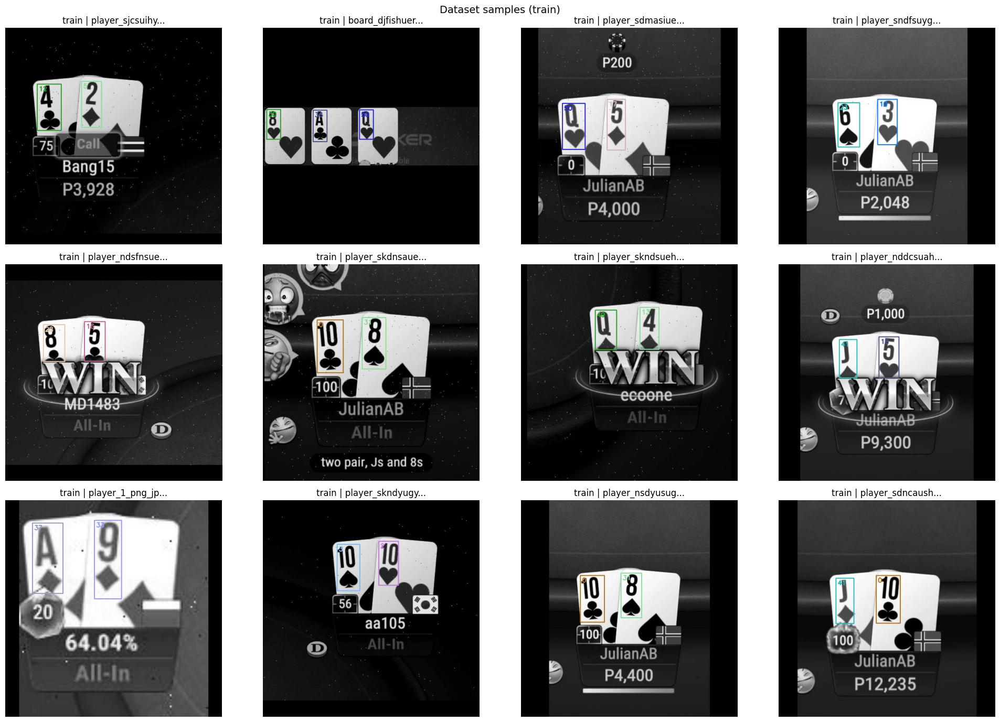

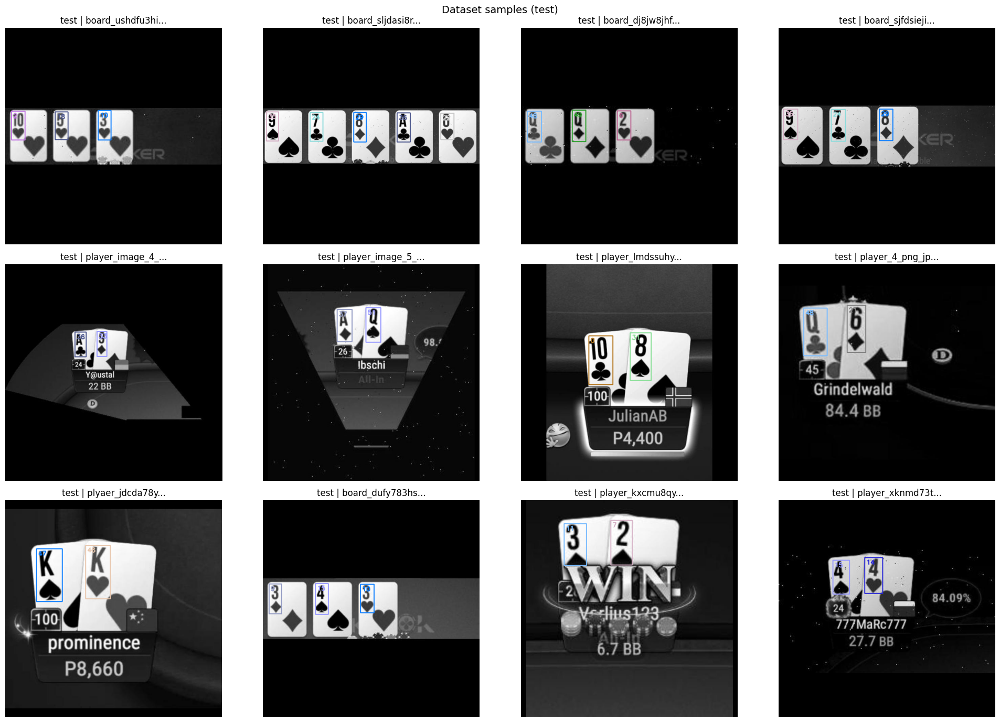

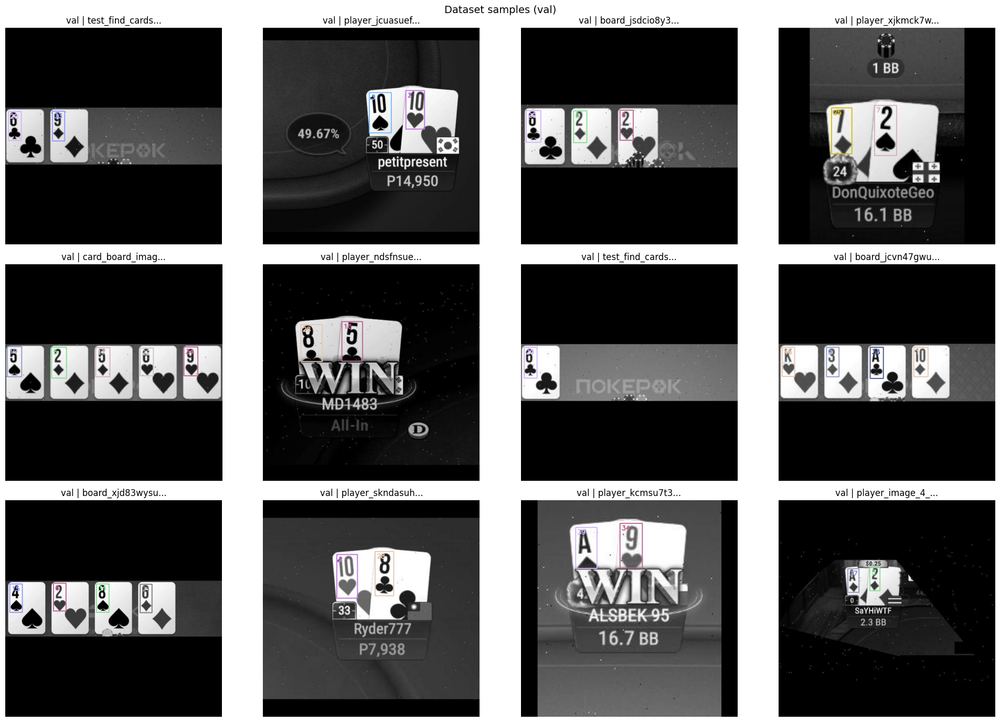

In [18]:
# Визуализация аннотаций
visualizer.visualize_ann(num_samples=12)

### Визуализация гистограммы

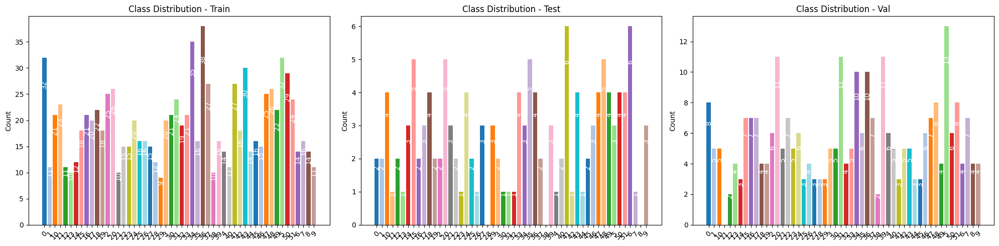

In [19]:
# Визуализация гистограмм распределения классов
visualizer.visualize_hist()

### Визуализация распределения количества bounding boxes

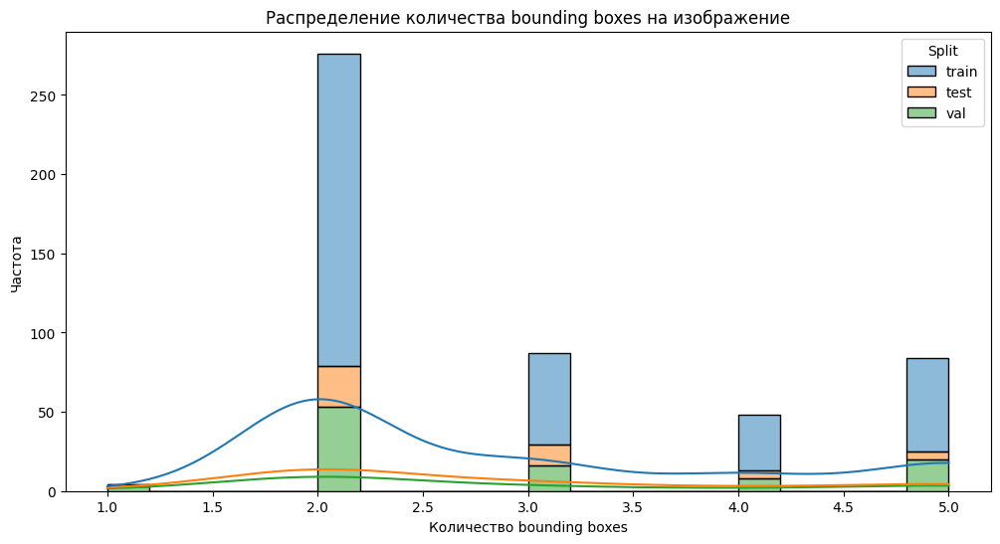

In [20]:
# Визуализация распределения количества боксов
visualizer.visualize_bbox_distribution()

### Визуализация распределения размеров bounding boxes

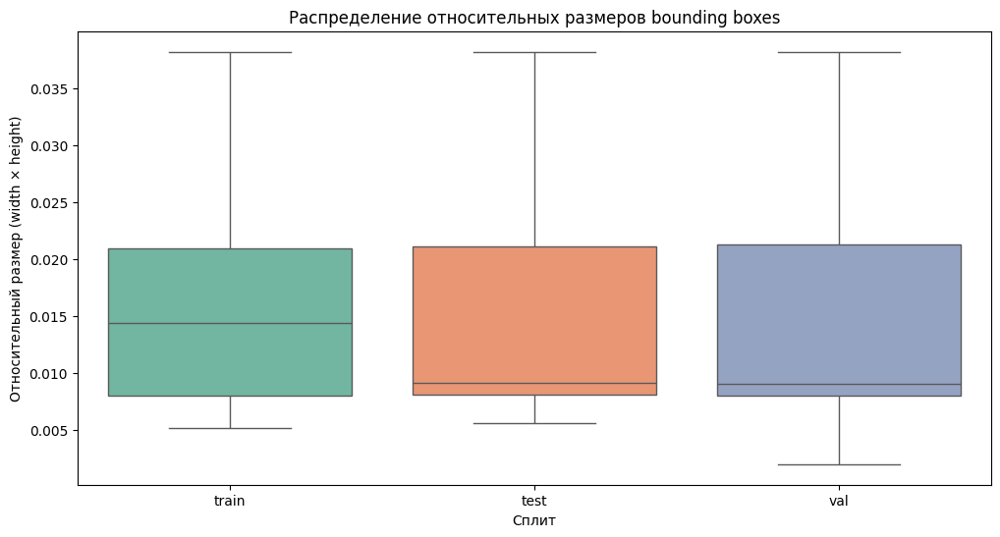

In [21]:
# Визуализация распределения размеров боксов
visualizer.visualize_bbox_size_distribution()

# Базовое обучение модели YOLOv9

## Инициализация параметров

In [53]:
augm = {
    "hsv_h":  0,
    "hsv_s":  0,
    "hsv_v":  0,
    "degrees":  0,
    "fliplr":  0,
    "mosaic":  0,
    "mixup":  0,
    "translate": 0,
    "scale": 0,
    "shear": 0,
    "perspective": 0,
    "flipud": 0,
    "bgr": 0,
    "copy_paste": 0,
    "erasing": 0,
    "crop_fraction": 0
}

## Инициализация модели

In [54]:
model = YOLO('yolo12n.pt')

100%|████████████████████████████████████████████████████████████████████████████████| 5.34M/5.34M [00:00<00:00, 12.6MB/s]


## Обучение модели

In [55]:
# Тренировка
result_train = model.train(data="./dataset/dataset.yaml",
                           batch=12,
                           imgsz=512,
                           save=True,
                           device=0,
                           project="card",
                           name="yolo12n_v1",
                           exist_ok=True,
                           optimizer="AdamW",
                           verbose=True,
                           seed=42,
                           cos_lr=False,
                           val=True,
                           plots=True,
                           workers=0,
                           epochs=10,
                           resume=False,
                           augment=False,
                           amp=False,
                           **augm)

Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
WARNING ⚠️ Upgrade to torch>=2.0.0 for deterministic training.
engine/trainer: task=detect, mode=train, model=yolo12n.pt, data=./dataset/dataset.yaml, epochs=10, time=None, patience=100, batch=12, imgsz=512, save=True, save_period=-1, cache=False, device=0, workers=0, project=card, name=yolo12n_v1, exist_ok=True, pretrained=True, optimizer=AdamW, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=False, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, 

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 351 images, 2 backgrounds, 0 c

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 100 images, 0 backgrounds, 0 cor

Plotting labels to card/yolo12n_v1/labels.jpg... 


optimizer: AdamW(lr=0.01, momentum=0.937) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.00046875), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/yolo12n_v1
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.37G      1.016      4.109     0.9985          9        512: 100%|██████████| 30/30 [00:04<00:00,  7.17i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:0

                   all        100        289          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.53G     0.9119      3.204     0.9583         12        512: 100%|██████████| 30/30 [00:03<00:00,  8.94i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:0

                   all        100        289   6.02e-05     0.0218   4.06e-05   1.77e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.53G     0.8792      2.897     0.9367          6        512: 100%|██████████| 30/30 [00:03<00:00,  9.28i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:0

                   all        100        289     0.0297      0.517     0.0621     0.0439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.53G     0.8171      2.593     0.9177          9        512: 100%|██████████| 30/30 [00:03<00:00,  9.47i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:0


                   all        100        289     0.0499      0.371     0.0586      0.042

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.53G     0.7353      2.333     0.8892          6        512: 100%|██████████| 30/30 [00:03<00:00,  9.74i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:0


                   all        100        289      0.225      0.593      0.274      0.218

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.53G     0.6668      1.984     0.8754          6        512: 100%|██████████| 30/30 [00:03<00:00,  8.80i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:0


                   all        100        289      0.472      0.401      0.408       0.34

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.53G     0.6265       1.66     0.8627          9        512: 100%|██████████| 30/30 [00:03<00:00,  9.70i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:0

                   all        100        289      0.527      0.551      0.507      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.53G     0.5698      1.399     0.8456          8        512: 100%|██████████| 30/30 [00:03<00:00,  8.01i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:0

                   all        100        289      0.735      0.531      0.703      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.53G     0.5263      1.188     0.8357          9        512: 100%|██████████| 30/30 [00:03<00:00,  9.64i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:0

                   all        100        289      0.698      0.661      0.761      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.53G     0.4942      1.048     0.8248         11        512: 100%|██████████| 30/30 [00:03<00:00,  9.08i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:0

                   all        100        289      0.742       0.76      0.832      0.747



10 epochs completed in 0.019 hours.
Optimizer stripped from card/yolo12n_v1/weights/last.pt, 5.5MB
Optimizer stripped from card/yolo12n_v1/weights/best.pt, 5.5MB

Validating card/yolo12n_v1/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:0


                   all        100        289      0.739      0.762      0.832      0.746
                     0          8          8      0.944      0.875      0.982      0.843
                     1          5          5      0.733      0.559       0.68      0.579
                    10          5          5          1       0.61      0.895      0.807
                    12          2          2          1          0     0.0162     0.0146
                    13          4          4          1      0.869      0.995      0.921
                    14          3          3      0.493      0.667      0.682      0.564
                    15          7          7      0.797      0.857      0.937      0.851
                    16          7          7      0.526      0.429      0.642      0.585
                    17          7          7      0.577      0.571      0.669      0.586
                    18          4          4      0.408      0.869      0.578      0.545
                    1

## Инициализация модели с лучшим чекпоинтом

In [56]:
model = YOLO(r'./card/yolo12n_v1/weights/best.pt')

## Вычисляем метрики на тестовых данных

In [57]:
results_val = model.val(source="./dataset/test/images/",
                        device=0,
                        imgsz=512,
                        save=True,
                        conf=0.5,
                        iou=0.5,
                        show_labels=True,
                        augment=False)

Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 100 images, 0 backgrounds, 0 cor
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0


                   all        100        289      0.688      0.547      0.625      0.573
                     0          8          8          1      0.375      0.687      0.627
                     1          5          5          0          0          0          0
                    10          5          5          1        0.2        0.6        0.6
                    12          2          2          0          0          0          0
                    13          4          4          0          0          0          0
                    14          3          3          0          0          0          0
                    15          7          7          1      0.857      0.928       0.85
                    16          7          7        0.5      0.143      0.286      0.286
                    17          7          7          1      0.429      0.714      0.643
                    18          4          4      0.286        0.5      0.389      0.389
                    1

## Инференс моделью

In [59]:
result_inf = model.predict(source="./dataset/test/images/",
                           device=0,
                           imgsz=512,
                           save=True,
                           conf=0.5,
                           iou=0.5,
                           show_labels=True,
                           augment=False)


image 1/50 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_dj8jw8jhfw83_png_jpg.rf.0a9e13522f827ac13565c7adea5feac0.jpg: 512x512 1 49, 1 6, 13.4ms
image 2/50 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_dj8jw8jhfw83_png_jpg.rf.483aff50b8135870bae9090e5744193e.jpg: 512x512 1 49, 1 6, 12.4ms
image 3/50 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_dskck93jwd93j_png_jpg.rf.1cc0e83538e1ce49907ff2a003123b23.jpg: 512x512 1 18, 1 25, 1 34, 1 43, 1 5, 12.3ms
image 4/50 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_dufy783hsuher3_png_jpg.rf.35f4b7126bca739b6f98833d252b7ec9.jpg: 512x512 1 15, 11.9ms
image 5/50 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_dufy783hsuher3_png_jpg.rf.386ac0ec22238faa713427f011280b25.jpg: 512x512 1 15, 12.0ms
image 6/50 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_jcvn47gwu3_png_jpg.rf.59aff28274c5238a71a51a1622

## Визуализируем графики обучения

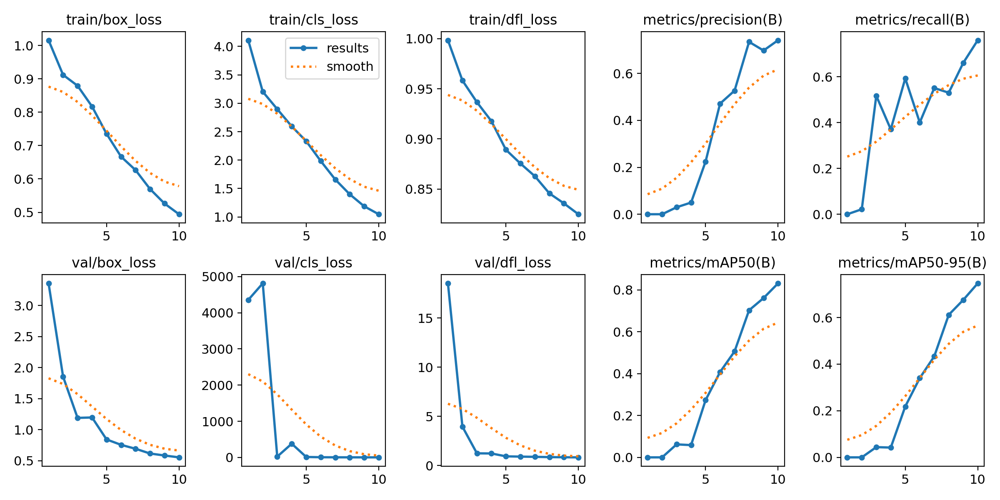

In [60]:
location = "./card/yolo12n_v1"
ipd.display(ipd.Image(os.path.join(location, "results.png")))

# Функция для расчёта IoU и отрисовки ошибок предсказаний модели

## Класс YOLOVisualizer

In [61]:
class YOLOVisualizer:
    def __init__(self, dataset_path: str, model_weights_path: str):
        self.dataset_path = dataset_path
        self.model_weights_path = model_weights_path
        self.test_image_dir = os.path.join(dataset_path, "test/images")
        self.test_label_dir = os.path.join(dataset_path, "test/labels")
        self.test_images = []
        self.test_annotations = []
        self._load_test_data()
        self.model = self._load_model()

    def _load_test_data(self) -> None:
        for filename in os.listdir(self.test_image_dir):
            if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
                img_path = os.path.join(self.test_image_dir, filename)
                label_filename = os.path.splitext(filename)[0] + '.txt'
                label_path = os.path.join(self.test_label_dir, label_filename)
                if os.path.exists(label_path):
                    self.test_images.append(img_path)
                    self.test_annotations.append(label_path)
                else:
                    print(f"Warning: Annotation missing for {filename}")

    def _load_model(self) -> YOLO:
        return YOLO(fr'{self.model_weights_path}')

    def visualize_predictions(self, image_index: int, conf_thr: float = 0.5) -> Image.Image:
        if image_index >= len(self.test_images):
            raise ValueError(f"Image index out of range. Maximum allowed: {len(self.test_images)-1}")
        image_path = self.test_images[image_index]
        label_path = self.test_annotations[image_index]
        result_img = self._run_visualization(
            image_path=image_path,
            label_path=label_path,
            conf_thr=conf_thr
        )
        return Image.fromarray(result_img)

    def _calculate_iou(self, box1: tuple, box2: tuple) -> float:
        x_left = max(box1[0], box2[0])
        y_top = max(box1[1], box2[1])
        x_right = min(box1[2], box2[2])
        y_bottom = min(box1[3], box2[3])
        
        if x_right < x_left or y_bottom < y_top:
            return 0.0
        
        intersection_area = (x_right - x_left) * (y_bottom - y_top)
        box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
        box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])
        
        union_area = box1_area + box2_area - intersection_area
        return intersection_area / union_area if union_area > 0 else 0.0

    def _run_visualization(self, image_path: str, label_path: str, conf_thr: float) -> cv2.Mat:
        img = cv2.imread(image_path)
        h, w, _ = img.shape

        predictions = self.model.predict(img, conf=conf_thr)
        gt_boxes = []
        pred_boxes = []

        with open(label_path, 'r') as f:
            for line in f:
                class_id, x_center, y_center, width, height = map(float, line.strip().split())
                x_center *= w
                y_center *= h
                width *= w
                height *= h
                x1 = int(x_center - width/2)
                y1 = int(y_center - height/2)
                x2 = int(x_center + width/2)
                y2 = int(y_center + height/2)
                gt_boxes.append((x1, y1, x2, y2))
                cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 1)

        for box in predictions[0].boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            pred_boxes.append((x1, y1, x2, y2))
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 0, 255), 1)

        iou_scores = []
        for pred_box in pred_boxes:
            max_iou = 0.0
            for gt_box in gt_boxes:
                iou = self._calculate_iou(pred_box, gt_box)
                max_iou = max(max_iou, iou)
            iou_scores.append(max_iou)
        
        mean_iou = sum(iou_scores)/len(iou_scores) if len(iou_scores) > 0 else 0.0

        legend_x = w - 250
        legend_y = 40
        text_offset = 30
        
        cv2.rectangle(img, (legend_x+50, legend_y-25), 
                     (legend_x+225, legend_y+100), (255, 255, 255), -1)
        
        cv2.rectangle(img, (legend_x+60, legend_y), 
                     (legend_x+80, legend_y+20), (0, 0, 255), -1)
        cv2.putText(img, "Predictions", (legend_x+90, legend_y+15), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 0), 1)
        
        cv2.rectangle(img, (legend_x+60, legend_y+text_offset), 
                     (legend_x+80, legend_y+text_offset+20), (0, 255, 0), -1)
        cv2.putText(img, "Ground Truth", (legend_x+90, legend_y+text_offset+15), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 0), 1)
        
        cv2.putText(img, f"Mean IoU: {mean_iou:.2f}", 
                   (legend_x+60, legend_y+text_offset*2+20), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 0), 1)

        return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    @property
    def test_samples_count(self) -> int:
        return len(self.test_images)

In [62]:
def display_pred_and_ground(
    dataset_path: str,
    model_weights: str,
    num_sample: int
) -> None:
    
    visualizer = YOLOVisualizer(dataset_path, model_weights)
    if visualizer.test_samples_count > num_sample:
        result_image = visualizer.visualize_predictions(num_sample)
        ipd.display(result_image)

## Проверка


0: 512x512 1 30, 1 36, 1 50, 12.2ms
Speed: 1.3ms preprocess, 12.2ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


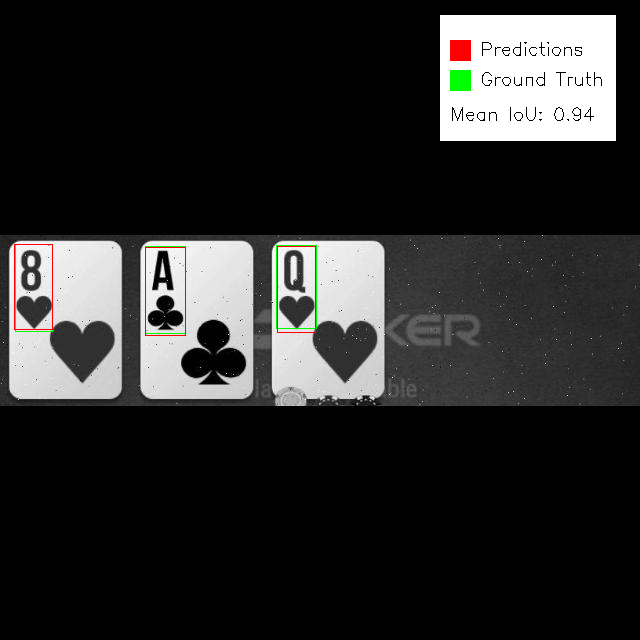

In [63]:
# Визуализируем результат предсказания
display_pred_and_ground(
    "./dataset",
    "./card/yolo12n_v1/weights/best.pt",
    12
)

# Применение аугментаций к обучению

## Инициализация параметров

In [64]:
# Дефолтно аугментация включена

## Инициализация модели

In [66]:
model = YOLO('yolo12n.pt')

## Обучение модели

In [67]:
# Тренировка
result_train = model.train(data="./dataset/dataset.yaml",
                           batch=12,
                           imgsz=512,
                           save=True,
                           device=0,
                           project="card",
                           name="yolo12n_v2",
                           exist_ok=True,
                           optimizer="AdamW",
                           verbose=True,
                           seed=42,
                           cos_lr=False,
                           val=True,
                           plots=True,
                           workers=0,
                           epochs=10,
                           resume=False,
                           augment=False,
                           amp=False)

Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
WARNING ⚠️ Upgrade to torch>=2.0.0 for deterministic training.
engine/trainer: task=detect, mode=train, model=yolo12n.pt, data=./dataset/dataset.yaml, epochs=10, time=None, patience=100, batch=12, imgsz=512, save=True, save_period=-1, cache=False, device=0, workers=0, project=card, name=yolo12n_v2, exist_ok=True, pretrained=True, optimizer=AdamW, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=False, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, 

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 351 images, 2 backgrounds, 0 c

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 100 images, 0 backgrounds, 0 cor

Plotting labels to card/yolo12n_v2/labels.jpg... 


optimizer: AdamW(lr=0.01, momentum=0.937) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.00046875), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/yolo12n_v2
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.45G      1.166      4.408      1.097          9        512: 100%|██████████| 30/30 [00:05<00:00,  5.37i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:0

                   all        100        289          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.72G      1.157      3.667       1.12         10        512: 100%|██████████| 30/30 [00:04<00:00,  6.22i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:08<00:0

                   all        100        289          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.72G      1.133      3.339      1.114          6        512: 100%|██████████| 30/30 [00:04<00:00,  6.38i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:08<00:0

                   all        100        289          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.72G     0.9676      3.214      1.045          9        512: 100%|██████████| 30/30 [00:04<00:00,  6.53i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:0


                   all        100        289      0.204      0.208     0.0478     0.0308

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.72G     0.8867      3.073      1.005          6        512: 100%|██████████| 30/30 [00:04<00:00,  6.55i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:0


                   all        100        289      0.171     0.0594     0.0366     0.0291

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.72G     0.8401      2.925     0.9836          6        512: 100%|██████████| 30/30 [00:04<00:00,  6.52i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:0


                   all        100        289      0.235      0.226     0.0908     0.0689

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.72G     0.7805      2.806     0.9522          9        512: 100%|██████████| 30/30 [00:04<00:00,  6.54i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:0


                   all        100        289      0.187       0.34      0.111     0.0938

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.72G     0.7666      2.694     0.9503          8        512: 100%|██████████| 30/30 [00:04<00:00,  6.39i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:0

                   all        100        289      0.332       0.28      0.156      0.131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.72G     0.7613      2.613     0.9465          9        512: 100%|██████████| 30/30 [00:04<00:00,  6.57i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:0

                   all        100        289      0.279      0.393      0.225      0.189



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.72G      0.727      2.565     0.9332         10        512: 100%|██████████| 30/30 [00:04<00:00,  6.42i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:0

                   all        100        289      0.291      0.314      0.231      0.199



10 epochs completed in 0.023 hours.
Optimizer stripped from card/yolo12n_v2/weights/last.pt, 5.5MB
Optimizer stripped from card/yolo12n_v2/weights/best.pt, 5.5MB

Validating card/yolo12n_v2/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:0


                   all        100        289      0.291      0.314       0.23      0.199
                     0          8          8      0.128          1      0.612      0.501
                     1          5          5      0.164      0.131      0.162      0.133
                    10          5          5      0.292        0.4       0.25      0.224
                    12          2          2          0          0     0.0121     0.0109
                    13          4          4          1          0      0.034      0.031
                    14          3          3          0          0     0.0216     0.0203
                    15          7          7          1          0      0.035     0.0303
                    16          7          7     0.0586      0.429      0.109      0.086
                    17          7          7          0          0       0.17      0.126
                    18          4          4          0          0      0.115      0.104
                    1

## Инициализация модели с лучшим чекпоинтом

In [68]:
model = YOLO(r'./card/yolo12n_v2/weights/best.pt')

## Вычисляем метрики на тестовых данных

In [69]:
results_val = model.val(source="./dataset/test/images/",
                        device=0,
                        imgsz=512,
                        save=True,
                        conf=0.5,
                        iou=0.5,
                        show_labels=True,
                        augment=False)

Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 100 images, 0 backgrounds, 0 cor
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0


                   all        100        289     0.0196    0.00754     0.0136     0.0118
                     0          8          8          0          0          0          0
                     1          5          5          0          0          0          0
                    10          5          5          0          0          0          0
                    12          2          2          0          0          0          0
                    13          4          4          0          0          0          0
                    14          3          3          0          0          0          0
                    15          7          7          0          0          0          0
                    16          7          7          0          0          0          0
                    17          7          7          0          0          0          0
                    18          4          4          0          0          0          0
                    1

## Инференс моделью

In [70]:
result_inf = model.predict(source="./dataset/test/images/",
                           device=0,
                           imgsz=512,
                           save=True,
                           conf=0.5,
                           iou=0.5,
                           show_labels=True,
                           augment=False)


image 1/50 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_dj8jw8jhfw83_png_jpg.rf.0a9e13522f827ac13565c7adea5feac0.jpg: 512x512 (no detections), 12.2ms
image 2/50 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_dj8jw8jhfw83_png_jpg.rf.483aff50b8135870bae9090e5744193e.jpg: 512x512 (no detections), 12.6ms
image 3/50 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_dskck93jwd93j_png_jpg.rf.1cc0e83538e1ce49907ff2a003123b23.jpg: 512x512 1 5, 12.1ms
image 4/50 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_dufy783hsuher3_png_jpg.rf.35f4b7126bca739b6f98833d252b7ec9.jpg: 512x512 (no detections), 12.2ms
image 5/50 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_dufy783hsuher3_png_jpg.rf.386ac0ec22238faa713427f011280b25.jpg: 512x512 (no detections), 12.2ms
image 6/50 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_jcvn47gwu3_png_jpg.rf.59aff28274c5238a

## Визуализируем графики

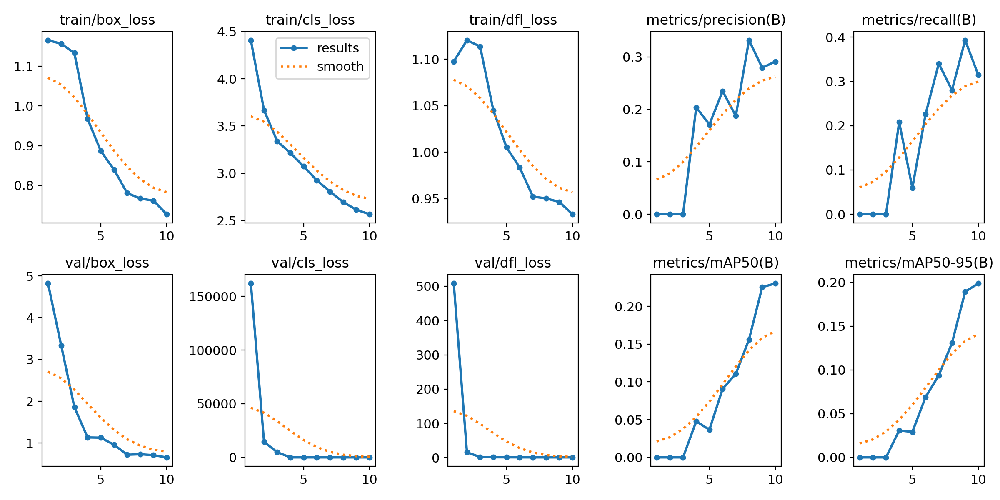

In [71]:
location = "./card/yolo12n_v2"
ipd.display(ipd.Image(os.path.join(location, "results.png")))

## Визуализируем результат предсказаний


0: 512x512 (no detections), 13.8ms
Speed: 1.3ms preprocess, 13.8ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 512)


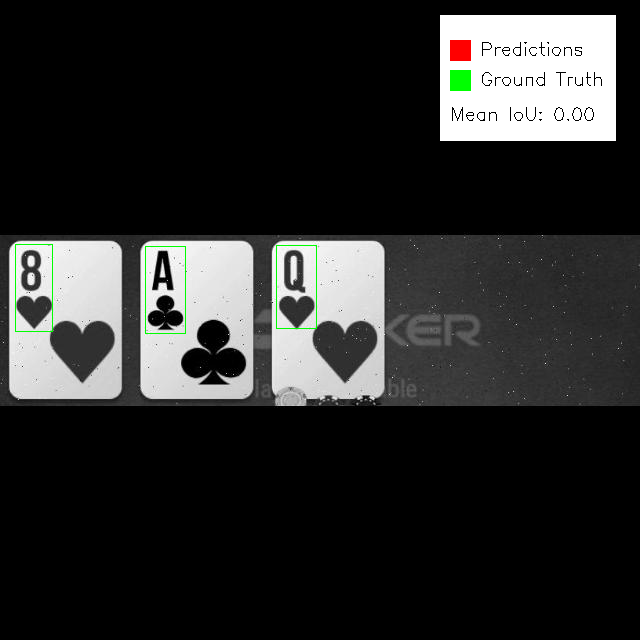

In [72]:
# Визуализируем результат предсказания
display_pred_and_ground(
    "./dataset",
    "./card/yolo12n_v2/weights/best.pt",
    12
)

# Тюнинг гиперпараметров

## Инициализация параметров

In [73]:
search_space = {
    "hsv_h":  (0, 0),
    "hsv_s":  (0, 0),
    "hsv_v":  (0, 0),
    "degrees":  (0, 0),
    "fliplr":  (0, 0),
    "mosaic":  (0, 0),
    "mixup":  (0, 0),
    "translate": (0, 0),
    "scale": (0, 0),
    "shear": (0, 0),
    "perspective": (0, 0),
    "flipud": (0, 0),
    "bgr": (0, 0),
    "copy_paste": (0, 0),
    "erasing": (0, 0),
    "crop_fraction": (0, 0),
    "lr0": (1e-5, 1e-1),
    "cls": (0.2, 4),
    "box": (0.02, 0.2),
    "warmup_momentum": (0, 0.95),
    "warmup_epochs": (0, 5),
    "weight_decay": (0, 0.001),
    "momentum": (0.6, 0.98),
    "lrf": (0.01, 1.0)
}

## Инициализация модели

In [74]:
model = YOLO('yolo12n.pt')

## Тюнинг модели

In [75]:
# Тренировка
result_tune = model.tune(data="./dataset/dataset.yaml",
                         batch=12,
                         imgsz=512,
                         save=True,
                         device=0,
                         project="card",
                         name="yolo12n_tune",
                         exist_ok=True,
                         verbose=True,
                         seed=42,
                         val=False,
                         plots=True,
                         workers=0,
                         epochs=5,
                         space=search_space,
                         iterations=10)

Tuner: Initialized Tuner instance with 'tune_dir=card/yolo12n_tune'
Tuner: 💡 Learn about tuning at https://docs.ultralytics.com/guides/hyperparameter-tuning
Tuner: Starting iteration 1/10 with hyperparameters: {'hsv_h': 0, 'hsv_s': 0, 'hsv_v': 0, 'degrees': 0.0, 'fliplr': 0, 'mosaic': 0, 'mixup': 0.0, 'translate': 0, 'scale': 0, 'shear': 0.0, 'perspective': 0.0, 'flipud': 0.0, 'bgr': 0.0, 'copy_paste': 0.0, 'erasing': 0, 'crop_fraction': 0, 'lr0': 0.01, 'cls': 0.5, 'box': 0.2, 'warmup_momentum': 0.8, 'warmup_epochs': 3.0, 'weight_decay': 0.0005, 'momentum': 0.937, 'lrf': 0.01}
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
WARNING ⚠️ Upgrade to torch>=2.0.0 for deterministic training.
engine/trainer: task=detect, mode=train, model=yolo12n.pt, data=./dataset/dataset.yaml, epochs=5, time=None, patience=100, batch=12, imgsz=512, save=True, save_period=-1, cache=False, device=0, workers=0, project=card, name=train, exist_ok=False, pretraine

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 351 images, 2 backgrounds, 0 corrupt: 100%|██████████| 351/351 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 100 images, 0 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<?, ?it/s]


Plotting labels to card/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.00046875), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.55G     0.0331      5.366      1.163         12        512: 100%|██████████| 30/30 [00:04<00:00,  6.42it/s]
  0%|          | 0/30 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.55G    0.02011       4.64     0.8619         10        512: 100%|██████████| 30/30 [00:03<00:00,  8.85it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.55G    0.01901      4.143      0.847          9        512: 100%|██████████| 30/30 [00:03<00:00,  9.14it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.55G    0.01799      3.788     0.8364          9        512: 100%|██████████| 30/30 [00:03<00:00,  9.47it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.55G     0.0172      3.493     0.8346          6        512: 100%|██████████| 30/30 [00:03<00:00,  9.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.86it/s]


                   all        100        289      0.112      0.527      0.141      0.117

5 epochs completed in 0.007 hours.
Optimizer stripped from card/train/weights/last.pt, 5.5MB
Optimizer stripped from card/train/weights/best.pt, 5.5MB

Validating card/train/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.67it/s]


                   all        100        289      0.112      0.528      0.141      0.116
                     0          8          8     0.0733       0.75      0.598      0.488
                     1          5          5          1          0     0.0467      0.042
                    10          5          5     0.0709          1      0.124      0.103
                    12          2          2     0.0139          1     0.0306     0.0276
                    13          4          4     0.0474        0.5      0.296      0.262
                    14          3          3          0          0          0          0
                    15          7          7     0.0273      0.286      0.276      0.159
                    16          7          7     0.0452      0.571       0.18      0.144
                    17          7          7     0.0337      0.571      0.305      0.215
                    18          4          4    0.00813       0.25     0.0245     0.0228
                    1

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 351 images, 2 backgrounds, 0 corrupt: 100%|██████████| 351/351 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 100 images, 0 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<?, ?it/s]


Plotting labels to card/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00775' and 'momentum=0.71973' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.00046875), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train2
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.55G    0.03277      6.101      1.151         12        512: 100%|██████████| 30/30 [00:04<00:00,  6.44it/s]
  0%|          | 0/30 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.55G    0.01986      5.294     0.8639         10        512: 100%|██████████| 30/30 [00:03<00:00,  8.84it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.55G    0.01894      4.722       0.85          9        512: 100%|██████████| 30/30 [00:03<00:00,  9.24it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.55G    0.01832      4.345     0.8448          9        512: 100%|██████████| 30/30 [00:03<00:00,  9.61it/s]
  0%|          | 0/30 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.55G    0.01799      4.078      0.847          6        512: 100%|██████████| 30/30 [00:03<00:00,  9.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.87it/s]


                   all        100        289     0.0252       0.69      0.156      0.133

5 epochs completed in 0.007 hours.
Optimizer stripped from card/train2/weights/last.pt, 5.5MB
Optimizer stripped from card/train2/weights/best.pt, 5.5MB

Validating card/train2/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.71it/s]


                   all        100        289     0.0255      0.691      0.155      0.132
                     0          8          8     0.0552          1      0.156      0.117
                     1          5          5          0          0          0          0
                    10          5          5     0.0352          1     0.0692     0.0498
                    12          2          2    0.00826          1     0.0253     0.0228
                    13          4          4     0.0488          1      0.196      0.161
                    14          3          3     0.0227      0.667      0.071     0.0516
                    15          7          7     0.0355      0.857      0.233      0.146
                    16          7          7     0.0377      0.857      0.355      0.255
                    17          7          7     0.0248      0.571     0.0376     0.0314
                    18          4          4     0.0188          1      0.264      0.237
                    1

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 351 images, 2 backgrounds, 0 corrupt: 100%|██████████| 351/351 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 100 images, 0 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<?, ?it/s]


Plotting labels to card/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00954' and 'momentum=0.83378' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.00054375), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train3
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.55G    0.03124      6.212      1.151         12        512: 100%|██████████| 30/30 [00:04<00:00,  6.36it/s]
  0%|          | 0/30 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.55G    0.01898      5.401     0.8668         10        512: 100%|██████████| 30/30 [00:03<00:00,  8.94it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.55G    0.01808      4.893     0.8552          9        512: 100%|██████████| 30/30 [00:03<00:00,  9.38it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.55G    0.01723        4.5      0.841          9        512: 100%|██████████| 30/30 [00:03<00:00,  9.53it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.55G    0.01681      4.183     0.8436          6        512: 100%|██████████| 30/30 [00:03<00:00,  9.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.89it/s]


                   all        100        289     0.0289      0.681      0.147      0.126

5 epochs completed in 0.007 hours.
Optimizer stripped from card/train3/weights/last.pt, 5.5MB
Optimizer stripped from card/train3/weights/best.pt, 5.5MB

Validating card/train3/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.80it/s]


                   all        100        289     0.0291      0.684      0.147      0.125
                     0          8          8     0.0519          1      0.114     0.0954
                     1          5          5     0.0526        0.4     0.0529     0.0454
                    10          5          5     0.0276          1     0.0711     0.0649
                    12          2          2    0.00862          1     0.0167      0.015
                    13          4          4     0.0294        0.5      0.131       0.11
                    14          3          3     0.0217      0.667     0.0235     0.0205
                    15          7          7     0.0409          1      0.156     0.0674
                    16          7          7     0.0423      0.857      0.236      0.172
                    17          7          7     0.0217      0.571     0.0518     0.0423
                    18          4          4     0.0215          1      0.267      0.239
                    1

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 351 images, 2 backgrounds, 0 corrupt: 100%|██████████| 351/351 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 100 images, 0 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<?, ?it/s]


Plotting labels to card/train4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00775' and 'momentum=0.71973' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.00050625), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train4
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.55G    0.03306      6.369      1.161         12        512: 100%|██████████| 30/30 [00:04<00:00,  6.42it/s]
  0%|          | 0/30 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.55G    0.02009      5.581     0.8638         10        512: 100%|██████████| 30/30 [00:03<00:00,  8.59it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.55G     0.0191      4.958     0.8438          9        512: 100%|██████████| 30/30 [00:03<00:00,  9.15it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.55G    0.01825      4.519     0.8366          9        512: 100%|██████████| 30/30 [00:03<00:00,  9.40it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.55G    0.01773      4.227     0.8392          6        512: 100%|██████████| 30/30 [00:03<00:00,  9.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.82it/s]


                   all        100        289     0.0259      0.731      0.152      0.127

5 epochs completed in 0.007 hours.
Optimizer stripped from card/train4/weights/last.pt, 5.5MB
Optimizer stripped from card/train4/weights/best.pt, 5.5MB

Validating card/train4/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.78it/s]


                   all        100        289     0.0259      0.731      0.149      0.124
                     0          8          8     0.0491          1      0.189      0.142
                     1          5          5     0.0625        0.2      0.123      0.111
                    10          5          5     0.0237          1      0.116     0.0863
                    12          2          2    0.00749          1     0.0262     0.0222
                    13          4          4     0.0198        0.5     0.0771     0.0629
                    14          3          3     0.0172      0.667      0.448      0.347
                    15          7          7     0.0312      0.857       0.15      0.102
                    16          7          7     0.0329      0.714      0.198      0.139
                    17          7          7     0.0235      0.857      0.209      0.147
                    18          4          4     0.0193          1      0.138      0.124
                    1

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 351 images, 2 backgrounds, 0 corrupt: 100%|██████████| 351/351 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 100 images, 0 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<?, ?it/s]


Plotting labels to card/train5/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0077' and 'momentum=0.69916' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.00045000000000000004), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train5
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.55G    0.03262      6.462      1.174         12        512: 100%|██████████| 30/30 [00:04<00:00,  6.50it/s]
  0%|          | 0/30 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.55G    0.01969      5.604     0.8671         10        512: 100%|██████████| 30/30 [00:03<00:00,  8.80it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.55G    0.01852       4.96     0.8495          9        512: 100%|██████████| 30/30 [00:03<00:00,  9.31it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.55G    0.01779      4.522     0.8447          9        512: 100%|██████████| 30/30 [00:03<00:00,  9.54it/s]
  0%|          | 0/30 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.55G    0.01734      4.166     0.8435          6        512: 100%|██████████| 30/30 [00:03<00:00,  9.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.87it/s]


                   all        100        289     0.0262      0.736      0.143       0.12

5 epochs completed in 0.007 hours.
Optimizer stripped from card/train5/weights/last.pt, 5.5MB
Optimizer stripped from card/train5/weights/best.pt, 5.5MB

Validating card/train5/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.70it/s]


                   all        100        289     0.0262      0.736      0.142       0.12
                     0          8          8     0.0526      0.875      0.666      0.508
                     1          5          5          0          0          0          0
                    10          5          5     0.0238          1      0.132       0.09
                    12          2          2    0.00826          1     0.0158     0.0135
                    13          4          4      0.037          1      0.112     0.0914
                    14          3          3     0.0238      0.667     0.0443      0.042
                    15          7          7     0.0289      0.714      0.075     0.0477
                    16          7          7     0.0461          1      0.307       0.25
                    17          7          7     0.0142      0.429      0.011    0.00765
                    18          4          4     0.0209          1      0.143      0.126
                    1

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 351 images, 2 backgrounds, 0 corrupt: 100%|██████████| 351/351 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 100 images, 0 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<?, ?it/s]


Plotting labels to card/train6/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00842' and 'momentum=0.76218' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.000609375), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train6
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.55G    0.03282      6.775      1.171         12        512: 100%|██████████| 30/30 [00:04<00:00,  6.44it/s]
  0%|          | 0/30 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.55G    0.01998      5.855     0.8638         10        512: 100%|██████████| 30/30 [00:03<00:00,  8.88it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.55G    0.01882      5.232      0.847          9        512: 100%|██████████| 30/30 [00:03<00:00,  9.25it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.55G    0.01809      4.785     0.8404          9        512: 100%|██████████| 30/30 [00:03<00:00,  9.52it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.55G     0.0176      4.456     0.8394          6        512: 100%|██████████| 30/30 [00:03<00:00,  9.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.84it/s]


                   all        100        289     0.0252      0.692      0.135      0.111

5 epochs completed in 0.007 hours.
Optimizer stripped from card/train6/weights/last.pt, 5.5MB
Optimizer stripped from card/train6/weights/best.pt, 5.5MB

Validating card/train6/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.78it/s]


                   all        100        289     0.0252      0.692      0.138      0.114
                     0          8          8     0.0588      0.875      0.285      0.227
                     1          5          5          0          0          0          0
                    10          5          5     0.0338          1      0.109     0.0965
                    12          2          2    0.00948          1     0.0221     0.0199
                    13          4          4      0.037          1      0.124      0.102
                    14          3          3     0.0177      0.667        0.1      0.087
                    15          7          7       0.04      0.857      0.205      0.112
                    16          7          7      0.048      0.857      0.242      0.189
                    17          7          7     0.0253      0.714     0.0317     0.0239
                    18          4          4     0.0187          1     0.0685     0.0616
                    1

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 351 images, 2 backgrounds, 0 corrupt: 100%|██████████| 351/351 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 100 images, 0 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<?, ?it/s]


Plotting labels to card/train7/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00775' and 'momentum=0.6' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.000553125), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train7
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.55G    0.03291      6.119      1.161         12        512: 100%|██████████| 30/30 [00:04<00:00,  6.38it/s]
  0%|          | 0/30 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.55G    0.02005      5.321     0.8643         10        512: 100%|██████████| 30/30 [00:03<00:00,  8.92it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.55G    0.01895      4.784     0.8479          9        512: 100%|██████████| 30/30 [00:03<00:00,  9.18it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.55G    0.01819      4.387     0.8401          9        512: 100%|██████████| 30/30 [00:03<00:00,  9.54it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.55G    0.01761      4.075     0.8403          6        512: 100%|██████████| 30/30 [00:03<00:00,  9.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.88it/s]


                   all        100        289     0.0272      0.715      0.148      0.125

5 epochs completed in 0.007 hours.
Optimizer stripped from card/train7/weights/last.pt, 5.5MB
Optimizer stripped from card/train7/weights/best.pt, 5.5MB

Validating card/train7/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.66it/s]


                   all        100        289     0.0276      0.715      0.149      0.125
                     0          8          8     0.0552          1      0.154      0.113
                     1          5          5      0.222        0.4      0.232      0.214
                    10          5          5     0.0253          1     0.0873     0.0676
                    12          2          2     0.0084          1    0.00967    0.00834
                    13          4          4     0.0312          1      0.155      0.136
                    14          3          3     0.0194      0.667      0.269      0.242
                    15          7          7     0.0426      0.857      0.114      0.077
                    16          7          7     0.0417      0.857     0.0779     0.0583
                    17          7          7     0.0249      0.857     0.0275     0.0231
                    18          4          4     0.0149       0.75     0.0928     0.0833
                    1

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 351 images, 2 backgrounds, 0 corrupt: 100%|██████████| 351/351 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 100 images, 0 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<?, ?it/s]


Plotting labels to card/train8/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00775' and 'momentum=0.6' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.000553125), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train8
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.55G    0.03318      6.132      1.164         12        512: 100%|██████████| 30/30 [00:04<00:00,  6.42it/s]
  0%|          | 0/30 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.55G     0.0204      5.296     0.8612         10        512: 100%|██████████| 30/30 [00:03<00:00,  8.82it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.55G    0.01898      4.753     0.8427          9        512: 100%|██████████| 30/30 [00:03<00:00,  9.13it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.55G    0.01819      4.362     0.8333          9        512: 100%|██████████| 30/30 [00:03<00:00,  9.54it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.55G    0.01767      4.078     0.8343          6        512: 100%|██████████| 30/30 [00:03<00:00,  9.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.86it/s]


                   all        100        289     0.0242       0.72      0.124      0.103

5 epochs completed in 0.007 hours.
Optimizer stripped from card/train8/weights/last.pt, 5.5MB
Optimizer stripped from card/train8/weights/best.pt, 5.5MB

Validating card/train8/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.75it/s]


                   all        100        289      0.024      0.714      0.124      0.103
                     0          8          8     0.0507      0.875       0.19      0.144
                     1          5          5          0          0          0          0
                    10          5          5     0.0279          1     0.0931     0.0844
                    12          2          2    0.00794          1     0.0237     0.0213
                    13          4          4     0.0326       0.75     0.0745     0.0635
                    14          3          3     0.0132      0.667     0.0192      0.016
                    15          7          7     0.0312          1      0.194      0.117
                    16          7          7      0.035      0.714      0.308      0.225
                    17          7          7     0.0169      0.571     0.0293     0.0226
                    18          4          4     0.0207          1      0.265      0.238
                    1

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 351 images, 2 backgrounds, 0 corrupt: 100%|██████████| 351/351 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 100 images, 0 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<?, ?it/s]


Plotting labels to card/train9/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00809' and 'momentum=0.85703' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.000365625), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train9
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.55G     0.0332      6.066      1.167         12        512: 100%|██████████| 30/30 [00:04<00:00,  6.31it/s]
  0%|          | 0/30 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.55G    0.02001      5.281     0.8619         10        512: 100%|██████████| 30/30 [00:03<00:00,  8.64it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.55G    0.01882      4.739     0.8452          9        512: 100%|██████████| 30/30 [00:03<00:00,  9.09it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.55G    0.01789      4.359     0.8355          9        512: 100%|██████████| 30/30 [00:03<00:00,  9.33it/s]
  0%|          | 0/30 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.55G    0.01745      4.077     0.8386          6        512: 100%|██████████| 30/30 [00:03<00:00,  9.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.85it/s]


                   all        100        289     0.0298      0.692      0.147      0.125

5 epochs completed in 0.007 hours.
Optimizer stripped from card/train9/weights/last.pt, 5.5MB
Optimizer stripped from card/train9/weights/best.pt, 5.5MB

Validating card/train9/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.78it/s]


                   all        100        289     0.0299      0.698      0.149      0.125
                     0          8          8     0.0438       0.75      0.165       0.12
                     1          5          5       0.04        0.4      0.154      0.129
                    10          5          5     0.0242          1     0.0996     0.0688
                    12          2          2    0.00851          1     0.0224     0.0186
                    13          4          4     0.0267        0.5     0.0968     0.0871
                    14          3          3     0.0196      0.667     0.0795     0.0636
                    15          7          7      0.038      0.857      0.162     0.0867
                    16          7          7     0.0455      0.857      0.252      0.181
                    17          7          7     0.0179      0.571     0.0381     0.0283
                    18          4          4    0.00508       0.25     0.0369     0.0332
                    1

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 351 images, 2 backgrounds, 0 corrupt: 100%|██████████| 351/351 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 100 images, 0 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<?, ?it/s]


Plotting labels to card/train10/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00803' and 'momentum=0.71973' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.00046875), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train10
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.55G    0.03342      7.131      1.175         12        512: 100%|██████████| 30/30 [00:04<00:00,  6.45it/s]
  0%|          | 0/30 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.55G    0.02011      6.195     0.8647         10        512: 100%|██████████| 30/30 [00:03<00:00,  8.91it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.55G    0.01927       5.53     0.8581          9        512: 100%|██████████| 30/30 [00:03<00:00,  9.28it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.55G    0.01861       5.03     0.8471          9        512: 100%|██████████| 30/30 [00:03<00:00,  9.42it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.55G    0.01776      4.675     0.8452          6        512: 100%|██████████| 30/30 [00:03<00:00,  9.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.88it/s]


                   all        100        289     0.0277      0.685      0.145      0.122

5 epochs completed in 0.007 hours.
Optimizer stripped from card/train10/weights/last.pt, 5.5MB
Optimizer stripped from card/train10/weights/best.pt, 5.5MB

Validating card/train10/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.73it/s]


                   all        100        289     0.0278      0.685      0.145      0.122
                     0          8          8      0.058          1      0.357      0.267
                     1          5          5     0.0294        0.2     0.0282     0.0197
                    10          5          5     0.0296          1     0.0703     0.0603
                    12          2          2    0.00897          1     0.0316     0.0284
                    13          4          4     0.0316       0.75      0.161      0.141
                    14          3          3     0.0215      0.667     0.0764     0.0547
                    15          7          7     0.0309      0.857      0.289      0.181
                    16          7          7     0.0423      0.857       0.28      0.214
                    17          7          7     0.0231      0.571      0.317      0.256
                    18          4          4     0.0192          1     0.0919     0.0821
                    1

## Смотрим на затюненные параметры

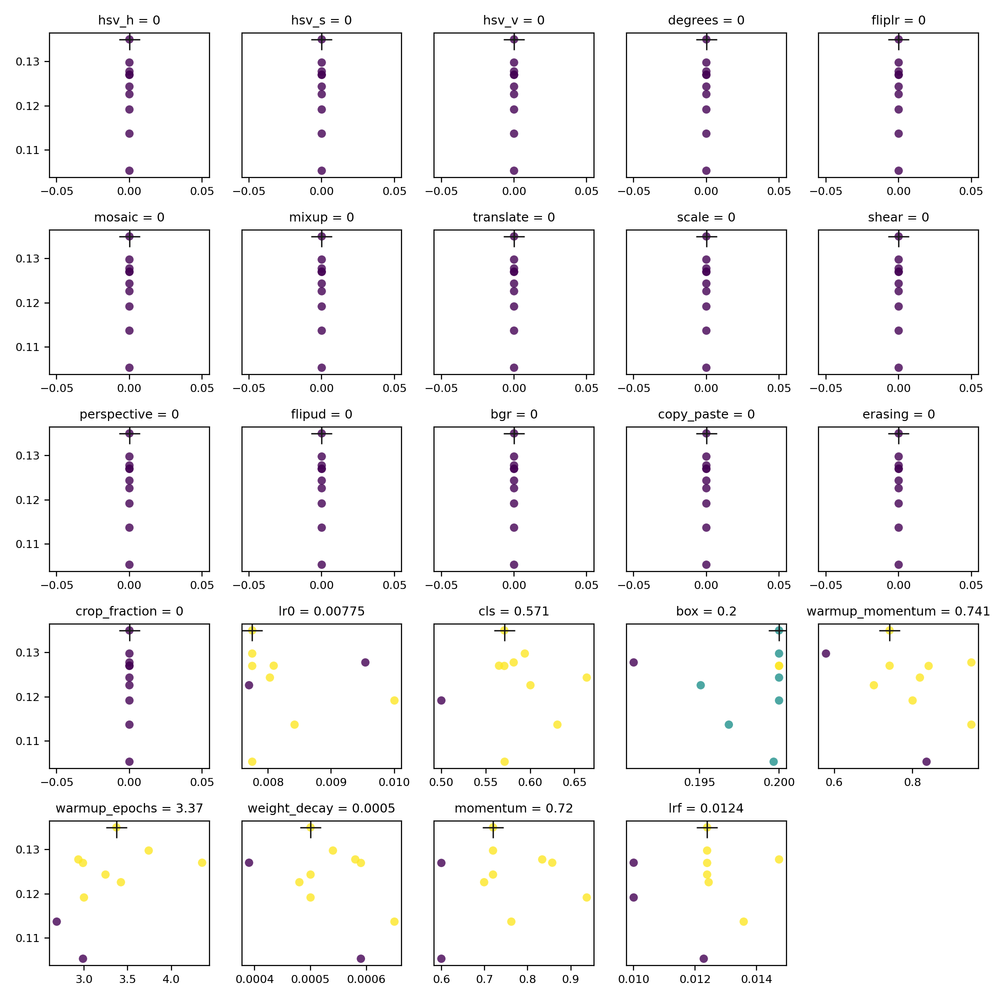

In [76]:
location = "./card/yolo12n_tune"
ipd.display(ipd.Image(os.path.join(location, "tune_scatter_plots.png")))

## Инициализируем найденые гиперпараметры

In [77]:
augm = {
    "hsv_h":  0,
    "hsv_s":  0,
    "hsv_v":  0,
    "degrees":  0,
    "fliplr":  0,
    "mosaic":  0,
    "mixup":  0,
    "translate": 0,
    "scale": 0,
    "shear": 0,
    "perspective": 0,
    "flipud": 0,
    "bgr": 0,
    "copy_paste": 0,
    "erasing": 0,
    "crop_fraction": 0,
    "lr0": 0.00775,
    "cls": 0.571,
    "box": 0.2,
    "warmup_momentum": 0.741,
    "warmup_epochs": 3.37,
    "weight_decay": 0.0005,
    "momentum": 0.72,
    "lrf": 0.0124
}

## Инициализируем модель

In [78]:
model = YOLO('yolo12n.pt')

## Обучаем модель

In [79]:
# Тренировка
result_train = model.train(data="./dataset/dataset.yaml",
                           batch=12,
                           imgsz=512,
                           save=True,
                           device=0,
                           project="card",
                           name="yolo12n_v3",
                           exist_ok=True,
                           optimizer="AdamW",
                           verbose=True,
                           seed=42,
                           cos_lr=False,
                           val=True,
                           plots=True,
                           workers=0,
                           epochs=10,
                           resume=False,
                           augment=False,
                           amp=False,
                           **augm)

Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
WARNING ⚠️ Upgrade to torch>=2.0.0 for deterministic training.
engine/trainer: task=detect, mode=train, model=yolo12n.pt, data=./dataset/dataset.yaml, epochs=10, time=None, patience=100, batch=12, imgsz=512, save=True, save_period=-1, cache=False, device=0, workers=0, project=card, name=yolo12n_v3, exist_ok=True, pretrained=True, optimizer=AdamW, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=False, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, 

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 351 images, 2 backgrounds, 0 c

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 100 images, 0 backgrounds, 0 cor

Plotting labels to card/yolo12n_v3/labels.jpg... 


optimizer: AdamW(lr=0.00775, momentum=0.72) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.00046875), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/yolo12n_v3
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.43G    0.03257      4.731      1.097          9        512: 100%|██████████| 30/30 [00:04<00:00,  7.06i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:0

                   all        100        289          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10       2.7G    0.03653      4.381      1.203         12        512: 100%|██████████| 30/30 [00:03<00:00,  8.71i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:0

                   all        100        289     0.0486     0.0703     0.0138    0.00948



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10       2.7G    0.03284       3.78      1.156          6        512: 100%|██████████| 30/30 [00:03<00:00,  9.20i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:0

                   all        100        289          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10       2.7G    0.03369      3.652      1.146          9        512: 100%|██████████| 30/30 [00:03<00:00,  9.11i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:0

                   all        100        289          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10       2.7G    0.02588      3.403      1.033          6        512: 100%|██████████| 30/30 [00:03<00:00,  9.53i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:07<00:0

                   all        100        289      0.019     0.0178     0.0195     0.0143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10       2.7G    0.02419      2.929       0.99          6        512: 100%|██████████| 30/30 [00:03<00:00,  9.57i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:0

                   all        100        289      0.366      0.481      0.258      0.195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10       2.7G    0.02168      2.374     0.9458          9        512: 100%|██████████| 30/30 [00:03<00:00,  9.68i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:0

                   all        100        289       0.59      0.421      0.436      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10       2.7G    0.01919      2.046     0.9064          8        512: 100%|██████████| 30/30 [00:03<00:00,  9.36i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:0

                   all        100        289      0.537      0.571       0.62      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10       2.7G    0.01749      1.689     0.8839          9        512: 100%|██████████| 30/30 [00:03<00:00,  9.73i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:0

                   all        100        289      0.592      0.648      0.704       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10       2.7G    0.01637      1.466     0.8654         11        512: 100%|██████████| 30/30 [00:03<00:00,  9.14i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:0

                   all        100        289      0.686      0.694      0.797      0.696



10 epochs completed in 0.023 hours.
Optimizer stripped from card/yolo12n_v3/weights/last.pt, 5.5MB
Optimizer stripped from card/yolo12n_v3/weights/best.pt, 5.5MB

Validating card/yolo12n_v3/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:0


                   all        100        289      0.686      0.694      0.797      0.696
                     0          8          8      0.669      0.875      0.931       0.74
                     1          5          5      0.641      0.724        0.7      0.596
                    10          5          5      0.571        0.6      0.752      0.693
                    12          2          2          1          0      0.133      0.119
                    13          4          4          1          0      0.845      0.731
                    14          3          3      0.362      0.333       0.51      0.466
                    15          7          7      0.722      0.857      0.874      0.787
                    16          7          7          1      0.728      0.995       0.84
                    17          7          7        0.4      0.429      0.661      0.496
                    18          4          4      0.863       0.75      0.816      0.747
                    1

## Инициализация модели с лучшим чекпоинтом

In [80]:
model = YOLO(r'./card/yolo12n_v3/weights/best.pt')

## Вычисляем метрики на тестовых данных

In [81]:
results_val = model.val(source="./dataset/test/images/",
                        device=0,
                        imgsz=512,
                        save=True,
                        conf=0.5,
                        iou=0.5,
                        show_labels=True,
                        augment=False)

Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 100 images, 0 backgrounds, 0 cor
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0


                   all        100        289      0.309      0.121      0.216      0.195
                     0          8          8          0          0          0          0
                     1          5          5          0          0          0          0
                    10          5          5          0          0          0          0
                    12          2          2          0          0          0          0
                    13          4          4          0          0          0          0
                    14          3          3          0          0          0          0
                    15          7          7          0          0          0          0
                    16          7          7          0          0          0          0
                    17          7          7          0          0          0          0
                    18          4          4          0          0          0          0
                    1

## Инференс моделью

In [82]:
result_inf = model.predict(source="./dataset/test/images/",
                           device=0,
                           imgsz=512,
                           save=True,
                           conf=0.5,
                           iou=0.5,
                           show_labels=True,
                           augment=False)


image 1/50 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_dj8jw8jhfw83_png_jpg.rf.0a9e13522f827ac13565c7adea5feac0.jpg: 512x512 (no detections), 12.1ms
image 2/50 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_dj8jw8jhfw83_png_jpg.rf.483aff50b8135870bae9090e5744193e.jpg: 512x512 (no detections), 12.4ms
image 3/50 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_dskck93jwd93j_png_jpg.rf.1cc0e83538e1ce49907ff2a003123b23.jpg: 512x512 1 5, 12.2ms
image 4/50 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_dufy783hsuher3_png_jpg.rf.35f4b7126bca739b6f98833d252b7ec9.jpg: 512x512 (no detections), 11.9ms
image 5/50 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_dufy783hsuher3_png_jpg.rf.386ac0ec22238faa713427f011280b25.jpg: 512x512 (no detections), 12.1ms
image 6/50 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_jcvn47gwu3_png_jpg.rf.59aff28274c5238a

## Визуализируем графики

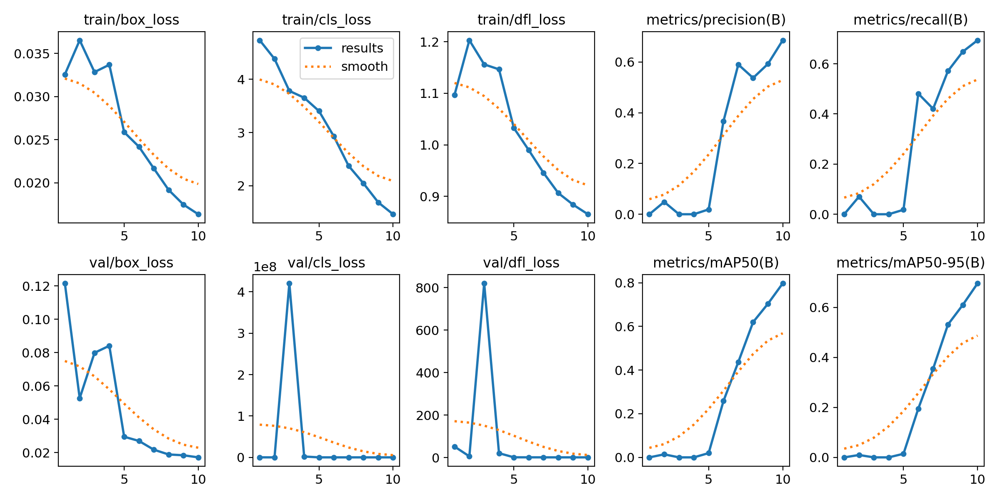

In [83]:
location = "./card/yolo12n_v3"
ipd.display(ipd.Image(os.path.join(location, "results.png")))

## Визуализируем результат предсказаний


0: 512x512 1 36, 1 50, 12.6ms
Speed: 1.4ms preprocess, 12.6ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 512)


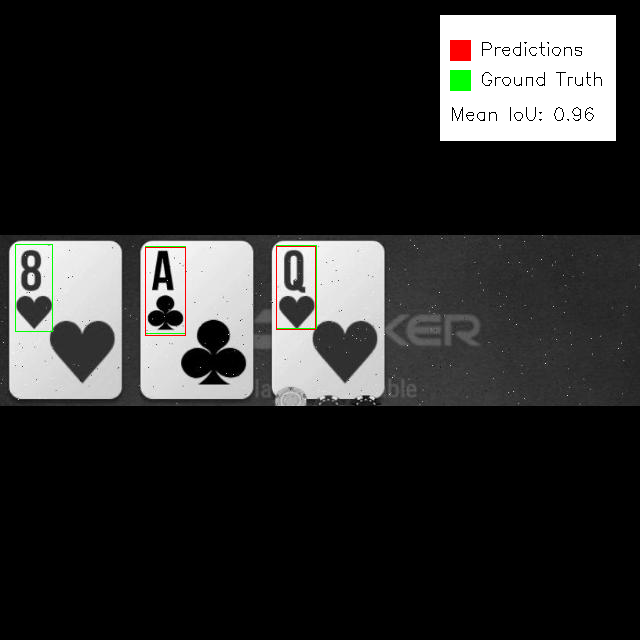

In [84]:
# Визуализируем результат предсказания
display_pred_and_ground(
    "./dataset",
    "./card/yolo12n_v3/weights/best.pt",
    12
)

# Улучшение модели добавлением новых данных

## Загружаем новый датасет и объединяем со старым

In [87]:
# Качаем данные
downloader = validate_with_pydantic(EntryRoboflowDatasetDownloader)(RoboflowDatasetDownloader)(
    entry = {
         "api_key": "7fwRxe7BbpO6YkhH7dW7",
         "workspace": "poker-ai",
         "project_name": "p.a.i-cards",
         "version": 2,
         "target_dir": "./dataset",
         "format_type": "yolov11",
         "overwrite": True
    }
)
    
dataset = downloader.download()
log.info(f"Dataset downloaded to: {dataset.location}")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to ./dataset in yolov11:: 100%|█████████████████████| 1158/1158 [00:00<00:00, 16213.96it/s]

/home/student/projects/CVTools/AnotherExample/dataset
Конфигурационный файл сохранен: /home/student/projects/CVTools/AnotherExample/dataset/dataset.yaml


15:55:56-231834 INFO     Dataset downloaded to: /home/student/projects/CVTools/AnotherExample/dataset

## Анализ структуры датасета

In [89]:
split_info, total, class_names = analyze_dataset_structure(dataset)

15:58:14-447613 INFO     Dataset Info:                                                                             
                         {'train': '../train/images', 'val': '../valid/images', 'test': '../test/images', 'nc': 52,
                         'names': ['10c', '10d', '10h', '10s', '2c', '2d', '2h', '2s', '3c', '3d', '3h', '3s',     
                         '4c', '4d', '4h', '4s', '5c', '5d', '5h', '5s', '6c', '6d', '6h', '6s', '7c', '7d', '7h', 
                         '7s', '8c', '8d', '8h', '8s', '9c', '9d', '9h', '9s', 'Ac', 'Ad', 'Ah', 'As', 'Jc', 'Jd', 
                         'Jh', 'Js', 'Kc', 'Kd', 'Kh', 'Ks', 'Qc', 'Qd', 'Qh', 'Qs'], 'roboflow': {'workspace':    
                         'poker-ai', 'project': 'p.a.i-cards', 'version': 2, 'license': 'MIT', 'url':              
                         'https://universe.roboflow.com/poker-ai/p.a.i-cards/dataset/2'}}

15:58:14-456066 INFO     Dataset Structure Analysis:                                                               
                         Train: 852 images at /home/student/projects/CVTools/AnotherExample/dataset/train/images   
                         Test: 74 images at /home/student/projects/CVTools/AnotherExample/dataset/test/images      
                         Val: 148 images at /home/student/projects/CVTools/AnotherExample/dataset/valid/images     
                                                                                                                   
                         Total images: 1074

In [90]:
visualizer = Visualize(dataset)

## Визуализация аннотаций

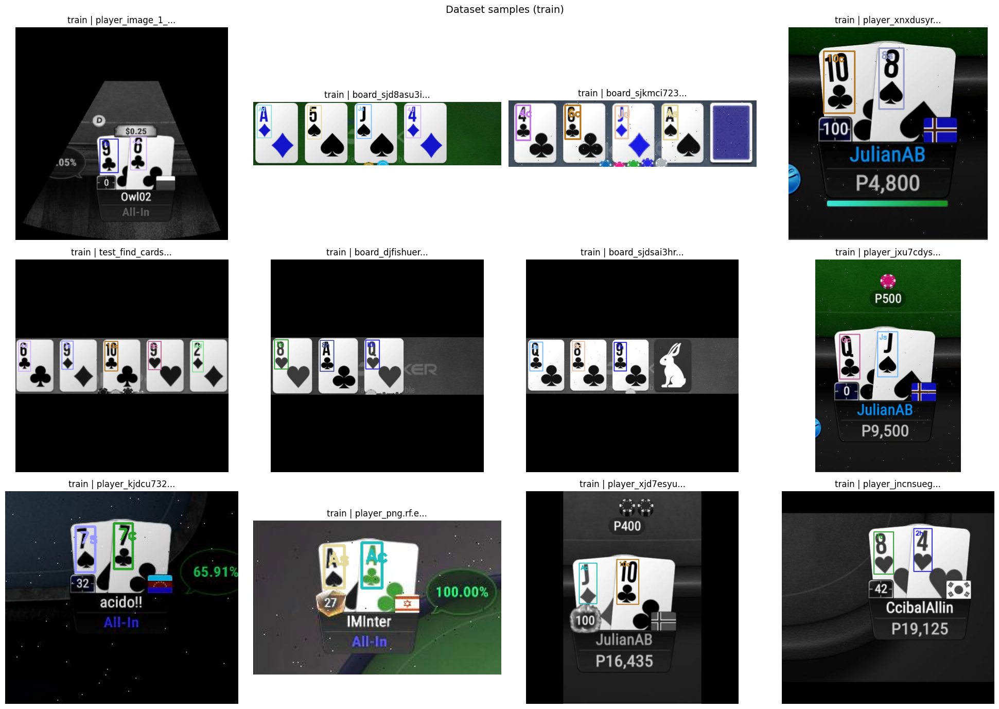

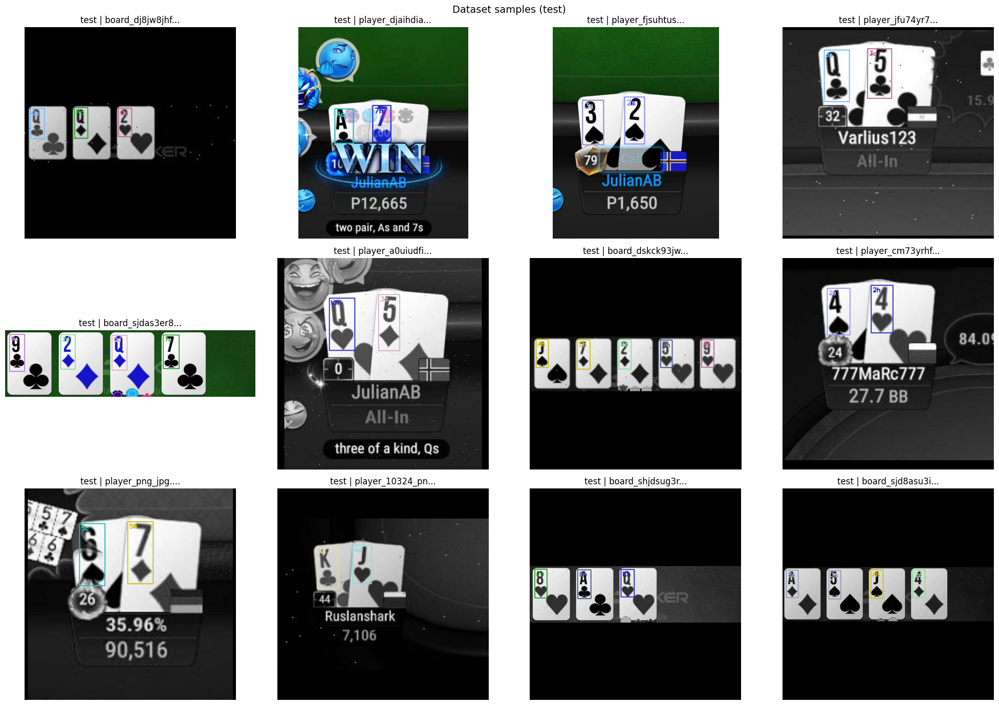

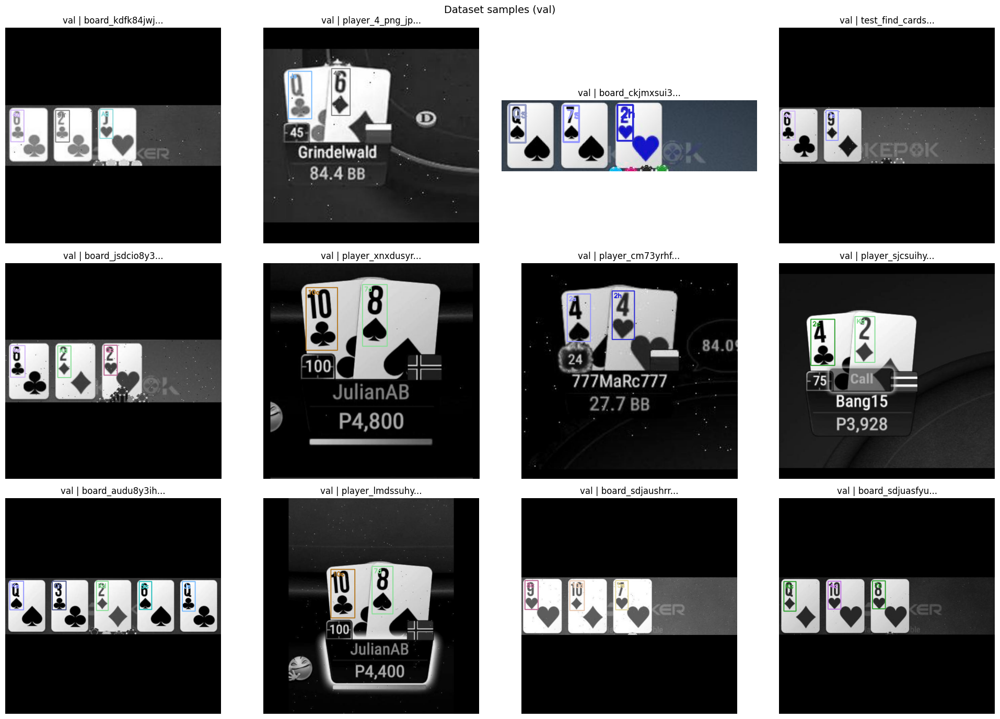

In [91]:
# Визуализация аннотаций
visualizer.visualize_ann(num_samples=12)

## Визуализация гистограммы

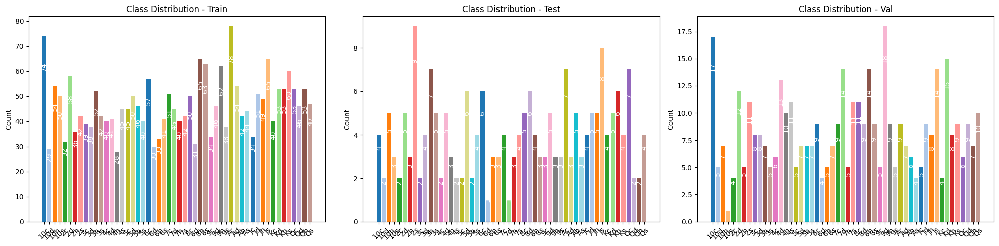

In [92]:
# Визуализация гистограмм распределения классов
visualizer.visualize_hist()

## Визуализация распределения количества bounding boxes

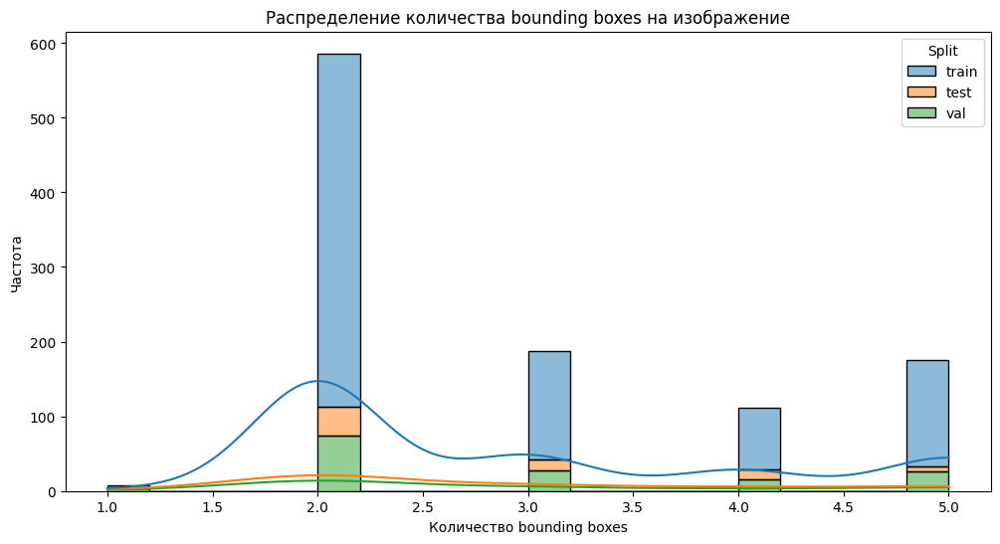

In [93]:
# Визуализация распределения количества боксов
visualizer.visualize_bbox_distribution()

## Визуализация распределения размеров bounding boxes

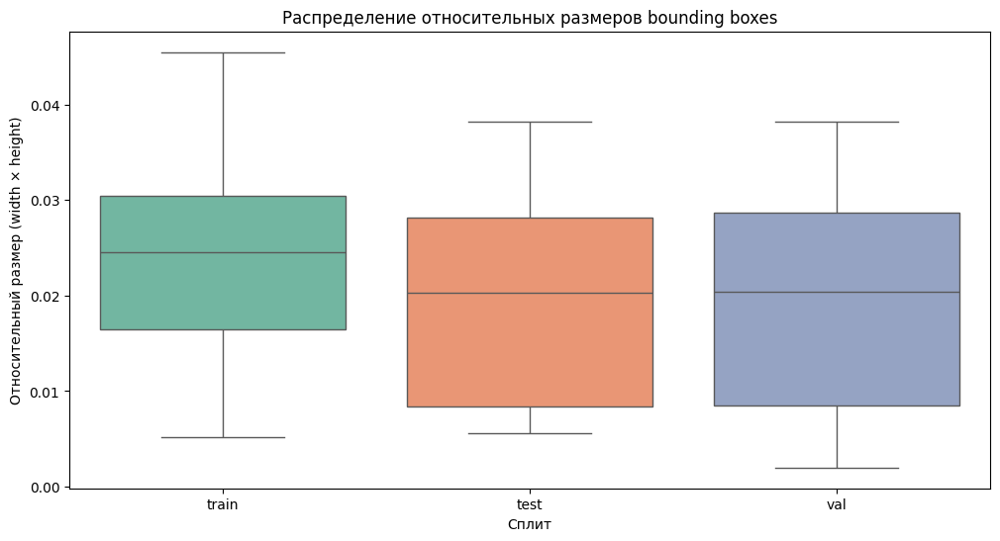

In [94]:
# Визуализация распределения размеров боксов
visualizer.visualize_bbox_size_distribution()

## Инициализация параметров

In [95]:
augm = {
    "hsv_h":  0,
    "hsv_s":  0,
    "hsv_v":  0,
    "degrees":  0,
    "fliplr":  0,
    "mosaic":  0,
    "mixup":  0,
    "translate": 0,
    "scale": 0,
    "shear": 0,
    "perspective": 0,
    "flipud": 0,
    "bgr": 0,
    "copy_paste": 0,
    "erasing": 0,
    "crop_fraction": 0
}

## Инициализация модели

In [96]:
model = YOLO('yolo12n.pt')

## Обучение модели

In [97]:
# Тренировка
result_train = model.train(data="./dataset/dataset.yaml",
                           batch=12,
                           imgsz=512,
                           save=True,
                           device=0,
                           project="card",
                           name="yolo12n_v4",
                           exist_ok=True,
                           optimizer="AdamW",
                           verbose=True,
                           seed=42,
                           cos_lr=False,
                           val=True,
                           plots=True,
                           workers=0,
                           epochs=10,
                           resume=False,
                           augment=False,
                           amp=False,
                           **augm)

Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
WARNING ⚠️ Upgrade to torch>=2.0.0 for deterministic training.
engine/trainer: task=detect, mode=train, model=yolo12n.pt, data=./dataset/dataset.yaml, epochs=10, time=None, patience=100, batch=12, imgsz=512, save=True, save_period=-1, cache=False, device=0, workers=0, project=card, name=yolo12n_v4, exist_ok=True, pretrained=True, optimizer=AdamW, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=False, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, 

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels... 852 images, 5 backgrounds, 0 corrupt

train: New cache created: /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels... 148 images, 0 backgrounds, 0 corrupt: 

val: New cache created: /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache


Plotting labels to card/yolo12n_v4/labels.jpg... 
optimizer: AdamW(lr=0.01, momentum=0.937) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.00046875), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/yolo12n_v4
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.35G     0.8373      3.582     0.9619         35        512: 100%|██████████| 71/71 [00:08<00:00,  7.93i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:0

                   all        148        430   0.000563     0.0789     0.0014    0.00054



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.62G     0.7777      2.735     0.9157         36        512: 100%|██████████| 71/71 [00:07<00:00,  9.42i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0


                   all        148        430     0.0779      0.486     0.0959     0.0733

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.62G      0.749      2.475     0.9086         33        512: 100%|██████████| 71/71 [00:07<00:00,  9.87i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:0

                   all        148        430      0.651      0.138     0.0823     0.0661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.62G      0.692      2.228     0.8879         36        512: 100%|██████████| 71/71 [00:07<00:00,  9.89i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.227      0.384      0.228      0.188



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.62G     0.5935      1.876     0.8561         41        512: 100%|██████████| 71/71 [00:07<00:00, 10.05i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.246      0.514      0.327      0.276



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.62G     0.5634      1.602      0.839         32        512: 100%|██████████| 71/71 [00:07<00:00, 10.01i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.356      0.588      0.497       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.62G     0.5002      1.336     0.8232         38        512: 100%|██████████| 71/71 [00:07<00:00,  9.86i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.441      0.601      0.579      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.62G     0.4661      1.097     0.8159         35        512: 100%|██████████| 71/71 [00:07<00:00,  9.87i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.541      0.661      0.676      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.62G     0.4285      0.906      0.804         31        512: 100%|██████████| 71/71 [00:07<00:00,  9.75i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.686      0.689      0.756      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.62G     0.3787     0.7361     0.7915         38        512: 100%|██████████| 71/71 [00:07<00:00,  9.25i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.752      0.739      0.815      0.733



10 epochs completed in 0.027 hours.
Optimizer stripped from card/yolo12n_v4/weights/last.pt, 5.5MB
Optimizer stripped from card/yolo12n_v4/weights/best.pt, 5.5MB

Validating card/yolo12n_v4/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:0


                   all        148        430      0.752      0.738      0.815      0.734
                   10c         17         17      0.986          1      0.995      0.911
                   10d          5          5      0.893          1      0.995       0.88
                   10h          7          7       0.74      0.857      0.902      0.788
                   10s          1          1      0.187          1      0.332      0.332
                    2c          4          4      0.793        0.5      0.582      0.543
                    2d         12         12      0.914      0.888      0.963      0.832
                    2h          5          5      0.754        0.8      0.938      0.847
                    2s         11         11      0.477      0.335      0.551      0.497
                    3c          8          8      0.722      0.875      0.866      0.772
                    3d          8          8      0.869      0.875      0.892      0.769
                    3

## Инициализация модели с лучшим чекпоинтом

In [99]:
model = YOLO(r'./card/yolo12n_v4/weights/best.pt')

## Вычисляем метрики на тестовых данных

In [100]:
results_val = model.val(source="./dataset/test/images/",
                        device=0,
                        imgsz=512,
                        save=True,
                        conf=0.5,
                        iou=0.5,
                        show_labels=True,
                        augment=False)

Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 cor
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00


                   all        148        430      0.798      0.694      0.772      0.708
                   10c         17         17          1      0.941      0.971      0.908
                   10d          5          5          1          1      0.995        0.9
                   10h          7          7       0.75      0.857       0.91      0.808
                   10s          1          1       0.25          1      0.332      0.332
                    2c          4          4          1        0.5       0.75      0.706
                    2d         12         12      0.909      0.833      0.886      0.771
                    2h          5          5        0.8        0.8      0.879      0.791
                    2s         11         11      0.429      0.273      0.273      0.245
                    3c          8          8      0.778      0.875      0.895      0.806
                    3d          8          8      0.857       0.75      0.785      0.702
                    3

## Инференс моделью

In [101]:
result_inf = model.predict(source="./dataset/test/images/",
                           device=0,
                           imgsz=512,
                           save=True,
                           conf=0.5,
                           iou=0.5,
                           show_labels=True,
                           augment=False)


image 1/74 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_dfjiresdf_png.rf.c38b75e834f1a56809fd2fe5f0e6b7c3.jpg: 160x512 1 2d, 1 3d, 1 5d, 16.8ms
image 2/74 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_dj8jw8jhfw83_png_jpg.rf.0a9e13522f827ac13565c7adea5feac0.jpg: 512x512 1 Kc, 12.5ms
image 3/74 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_dj8jw8jhfw83_png_jpg.rf.483aff50b8135870bae9090e5744193e.jpg: 512x512 1 Kc, 12.3ms
image 4/74 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_dskck93jwd93j_png_jpg.rf.1cc0e83538e1ce49907ff2a003123b23.jpg: 512x512 1 3h, 1 5h, 1 8c, 1 Ah, 1 Kd, 12.4ms
image 5/74 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_dufy783hsuher3_png_jpg.rf.35f4b7126bca739b6f98833d252b7ec9.jpg: 512x512 1 10h, 1 3d, 1 8d, 12.5ms
image 6/74 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_dufy783hsuher3_png_jpg.rf.386ac0ec22238fa

## Визуализируем графики обучения

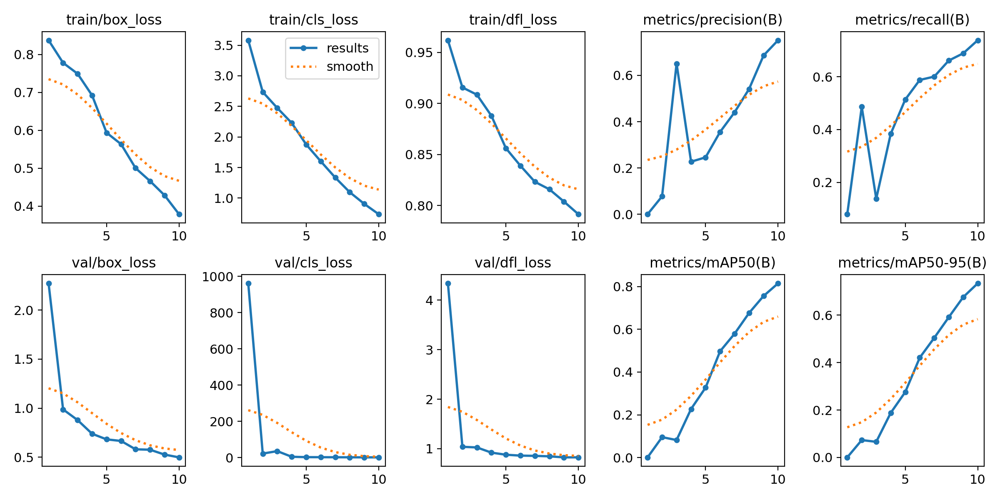

In [102]:
location = "./card/yolo12n_v4"
ipd.display(ipd.Image(os.path.join(location, "results.png")))

## Визуализиаруем результат предсказаний


0: 512x512 1 Jd, 1 Jh, 12.6ms
Speed: 1.3ms preprocess, 12.6ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


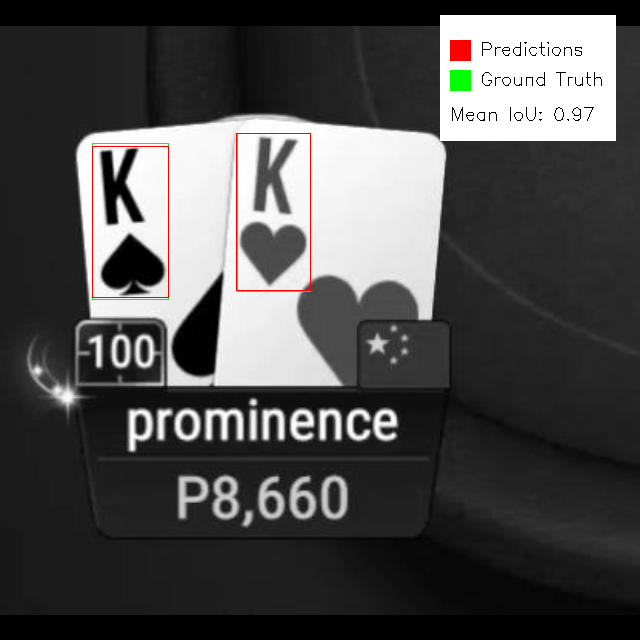

In [104]:
# Визуализируем результат предсказания
display_pred_and_ground(
    "./dataset",
    "./card/yolo12n_v4/weights/best.pt",
    12
)

# Заключительный проект

## Инициализация модели YOLO12n

In [105]:
model = YOLO('yolo12n.pt')

## Тюнинг по всем возможным параметрам

In [106]:
# Тренировка
result_tune = model.tune(data="./dataset/dataset.yaml",
                         batch=12,
                         imgsz=512,
                         save=True,
                         device=0,
                         project="card",
                         name="yolo12n_tune_v2",
                         exist_ok=True,
                         verbose=True,
                         seed=42,
                         val=False,
                         plots=True,
                         workers=0,
                         epochs=5,
                         iterations=30)

Tuner: Initialized Tuner instance with 'tune_dir=card/yolo12n_tune_v2'
Tuner: 💡 Learn about tuning at https://docs.ultralytics.com/guides/hyperparameter-tuning
Tuner: Starting iteration 1/30 with hyperparameters: {'lr0': 0.01, 'lrf': 0.01, 'momentum': 0.937, 'weight_decay': 0.0005, 'warmup_epochs': 3.0, 'warmup_momentum': 0.8, 'box': 7.5, 'cls': 0.5, 'dfl': 1.5, 'hsv_h': 0.015, 'hsv_s': 0.7, 'hsv_v': 0.4, 'degrees': 0.0, 'translate': 0.1, 'scale': 0.5, 'shear': 0.0, 'perspective': 0.0, 'flipud': 0.0, 'fliplr': 0.5, 'bgr': 0.0, 'mosaic': 1.0, 'mixup': 0.0, 'copy_paste': 0.0}
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
WARNING ⚠️ Upgrade to torch>=2.0.0 for deterministic training.
engine/trainer: task=detect, mode=train, model=yolo12n.pt, data=./dataset/dataset.yaml, epochs=5, time=None, patience=100, batch=12, imgsz=512, save=True, save_period=-1, cache=False, device=0, workers=0, project=card, name=train11, exist_ok=False, pretrained

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train11/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.00046875), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train11
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.56G      1.057      5.157      1.036         53        512: 100%|██████████| 71/71 [00:13<00:00,  5.27it/s]
  0%|          | 0/71 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.56G     0.7848      4.424     0.8804         43        512: 100%|██████████| 71/71 [00:11<00:00,  6.13it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.56G     0.7413      4.022     0.8813         48        512: 100%|██████████| 71/71 [00:11<00:00,  6.26it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.56G     0.7187      3.764     0.8846         53        512: 100%|██████████| 71/71 [00:11<00:00,  6.29it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.56G     0.6995      3.575     0.8882         44        512: 100%|██████████| 71/71 [00:11<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.56it/s]


                   all        148        430       0.21      0.131     0.0968     0.0854

5 epochs completed in 0.019 hours.
Optimizer stripped from card/train11/weights/last.pt, 5.5MB
Optimizer stripped from card/train11/weights/best.pt, 5.5MB

Validating card/train11/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.75it/s]


                   all        148        430      0.211      0.129     0.0972     0.0858
                   10c         17         17      0.323          1      0.804      0.722
                   10d          5          5          0          0      0.166      0.151
                   10h          7          7     0.0717      0.429      0.103     0.0952
                   10s          1          1          0          0     0.0433     0.0433
                    2c          4          4          0          0     0.0183     0.0152
                    2d         12         12      0.236          1      0.501       0.44
                    2h          5          5          1          0     0.0138     0.0122
                    2s         11         11          0          0     0.0324     0.0293
                    3c          8          8      0.126      0.125     0.0713     0.0602
                    3d          8          8          0          0      0.072     0.0588
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train12/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01099' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.000384375), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train12
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.56G     0.9319      5.138      1.031         45        512: 100%|██████████| 71/71 [00:13<00:00,  5.23it/s]
  0%|          | 0/71 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.56G     0.6993      4.421     0.8812         40        512: 100%|██████████| 71/71 [00:11<00:00,  6.05it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.56G     0.6658      4.014     0.8814         39        512: 100%|██████████| 71/71 [00:11<00:00,  6.27it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.56G     0.6585      3.788     0.8826         65        512: 100%|██████████| 71/71 [00:11<00:00,  6.37it/s]
  0%|          | 0/71 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.56G     0.6292      3.598     0.8877         40        512: 100%|██████████| 71/71 [00:11<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.62it/s]


                   all        148        430      0.219       0.15     0.0949     0.0843

5 epochs completed in 0.019 hours.
Optimizer stripped from card/train12/weights/last.pt, 5.5MB
Optimizer stripped from card/train12/weights/best.pt, 5.5MB

Validating card/train12/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.83it/s]


                   all        148        430      0.219      0.147     0.0951     0.0845
                   10c         17         17      0.418      0.928       0.78      0.678
                   10d          5          5          1          0      0.026     0.0231
                   10h          7          7      0.143      0.143      0.193      0.187
                   10s          1          1          1          0      0.166      0.166
                    2c          4          4          0          0     0.0236     0.0191
                    2d         12         12      0.214      0.583      0.395       0.36
                    2h          5          5          0          0     0.0135     0.0124
                    2s         11         11      0.491     0.0892     0.0843     0.0761
                    3c          8          8          0          0     0.0333     0.0287
                    3d          8          8          0          0     0.0491     0.0376
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train13/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00868' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.000525), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train13
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.56G      1.299       4.93      1.024         52        512: 100%|██████████| 71/71 [00:13<00:00,  5.29it/s]
  0%|          | 0/71 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.56G     0.9643      4.303     0.8751         50        512: 100%|██████████| 71/71 [00:11<00:00,  6.15it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.56G     0.9217      3.917     0.8838         47        512: 100%|██████████| 71/71 [00:11<00:00,  6.30it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.56G     0.8811       3.63     0.8832         52        512: 100%|██████████| 71/71 [00:11<00:00,  6.28it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.56G      0.848      3.504     0.8793         64        512: 100%|██████████| 71/71 [00:11<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.62it/s]


                   all        148        430      0.293      0.142     0.0812     0.0719

5 epochs completed in 0.019 hours.
Optimizer stripped from card/train13/weights/last.pt, 5.5MB
Optimizer stripped from card/train13/weights/best.pt, 5.5MB

Validating card/train13/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.82it/s]


                   all        148        430      0.293      0.141      0.082     0.0726
                   10c         17         17      0.217      0.882      0.705      0.619
                   10d          5          5          1          0     0.0238     0.0209
                   10h          7          7      0.142      0.143      0.103     0.0977
                   10s          1          1      0.116          1      0.332      0.332
                    2c          4          4          0          0     0.0495     0.0403
                    2d         12         12      0.215      0.667      0.456      0.401
                    2h          5          5          0          0     0.0135     0.0118
                    2s         11         11          1          0     0.0351     0.0305
                    3c          8          8          0          0      0.034     0.0292
                    3d          8          8          1          0     0.0263     0.0212
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train14/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00873' and 'momentum=0.95593' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.000440625), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train14
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.55G     0.9941      5.237     0.7993         50        512: 100%|██████████| 71/71 [00:13<00:00,  5.33it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.55G     0.7369      4.492     0.6896         53        512: 100%|██████████| 71/71 [00:11<00:00,  6.27it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.55G     0.7333      4.127     0.7029         39        512: 100%|██████████| 71/71 [00:11<00:00,  6.35it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.55G     0.6939      3.826     0.6999         40        512: 100%|██████████| 71/71 [00:11<00:00,  6.41it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.55G     0.6781      3.626     0.7085         46        512: 100%|██████████| 71/71 [00:11<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.56it/s]


                   all        148        430      0.191      0.169       0.11     0.0969

5 epochs completed in 0.019 hours.
Optimizer stripped from card/train14/weights/last.pt, 5.5MB
Optimizer stripped from card/train14/weights/best.pt, 5.5MB

Validating card/train14/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.70it/s]


                   all        148        430      0.191      0.175       0.11     0.0969
                   10c         17         17      0.382          1      0.856      0.768
                   10d          5          5          1          0     0.0527     0.0459
                   10h          7          7     0.0938      0.429      0.225      0.185
                   10s          1          1      0.204          1      0.332      0.332
                    2c          4          4          0          0     0.0267     0.0224
                    2d         12         12      0.342      0.917      0.483      0.432
                    2h          5          5          0          0     0.0136     0.0123
                    2s         11         11          0          0     0.0328     0.0304
                    3c          8          8          0          0      0.043     0.0373
                    3d          8          8          0          0     0.0374     0.0297
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train15/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.93673' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.00046875), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train15
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.56G      1.053      5.186      1.037         53        512: 100%|██████████| 71/71 [00:13<00:00,  5.27it/s]
  0%|          | 0/71 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.56G     0.7651      4.456     0.8775         54        512: 100%|██████████| 71/71 [00:11<00:00,  6.12it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.56G     0.7478      4.064     0.8868         58        512: 100%|██████████| 71/71 [00:11<00:00,  6.29it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.56G     0.7204      3.762     0.8903         43        512: 100%|██████████| 71/71 [00:11<00:00,  6.30it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.56G     0.7026      3.595     0.8797         59        512: 100%|██████████| 71/71 [00:11<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.49it/s]


                   all        148        430      0.244      0.122     0.0991     0.0883

5 epochs completed in 0.019 hours.
Optimizer stripped from card/train15/weights/last.pt, 5.5MB
Optimizer stripped from card/train15/weights/best.pt, 5.5MB

Validating card/train15/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.67it/s]


                   all        148        430      0.243      0.121      0.099     0.0881
                   10c         17         17      0.246          1      0.846      0.758
                   10d          5          5          1          0      0.251      0.246
                   10h          7          7          0          0     0.0485     0.0459
                   10s          1          1          1          0     0.0415     0.0415
                    2c          4          4          0          0     0.0271     0.0225
                    2d         12         12      0.243      0.667       0.48      0.423
                    2h          5          5          0          0     0.0128     0.0113
                    2s         11         11          1          0     0.0397      0.036
                    3c          8          8          0          0     0.0339     0.0294
                    3d          8          8          0          0     0.0427     0.0346
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train16/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00886' and 'momentum=0.87285' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.000459375), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train16
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.56G     0.9385      4.938      1.037         49        512: 100%|██████████| 71/71 [00:13<00:00,  5.27it/s]
  0%|          | 0/71 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.56G     0.7133      4.242     0.8876         43        512: 100%|██████████| 71/71 [00:11<00:00,  6.04it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.56G     0.6636      3.857     0.8831         43        512: 100%|██████████| 71/71 [00:11<00:00,  6.25it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.56G     0.6468      3.608     0.8831         54        512: 100%|██████████| 71/71 [00:11<00:00,  6.25it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.56G     0.6249      3.409     0.8868         45        512: 100%|██████████| 71/71 [00:11<00:00,  6.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.55it/s]


                   all        148        430      0.201      0.139     0.0993     0.0883

5 epochs completed in 0.019 hours.
Optimizer stripped from card/train16/weights/last.pt, 5.5MB
Optimizer stripped from card/train16/weights/best.pt, 5.5MB

Validating card/train16/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.69it/s]


                   all        148        430      0.201      0.139     0.0993     0.0879
                   10c         17         17      0.331      0.765      0.702      0.627
                   10d          5          5          1          0     0.0515      0.047
                   10h          7          7      0.108          1      0.265      0.236
                   10s          1          1          1          0     0.0905     0.0905
                    2c          4          4          0          0     0.0219     0.0182
                    2d         12         12      0.201      0.833      0.437      0.392
                    2h          5          5          1          0     0.0137      0.012
                    2s         11         11          0          0     0.0325     0.0291
                    3c          8          8          0          0     0.0458       0.04
                    3d          8          8          0          0     0.0477     0.0386
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train17/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00936' and 'momentum=0.84999' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.00043125000000000005), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train17
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.56G      0.963      4.936      1.023         48        512: 100%|██████████| 71/71 [00:13<00:00,  5.25it/s]
  0%|          | 0/71 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.56G     0.7281      4.239     0.8749         44        512: 100%|██████████| 71/71 [00:11<00:00,  6.09it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.56G     0.6646      3.858     0.8702         44        512: 100%|██████████| 71/71 [00:11<00:00,  6.35it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.56G     0.6508      3.594     0.8722         53        512: 100%|██████████| 71/71 [00:11<00:00,  6.34it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.56G     0.6314      3.399     0.8744         45        512: 100%|██████████| 71/71 [00:11<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.51it/s]


                   all        148        430       0.21      0.125      0.102     0.0901

5 epochs completed in 0.019 hours.
Optimizer stripped from card/train17/weights/last.pt, 5.5MB
Optimizer stripped from card/train17/weights/best.pt, 5.5MB

Validating card/train17/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.75it/s]


                   all        148        430       0.21      0.125      0.102     0.0901
                   10c         17         17      0.297      0.941      0.743      0.675
                   10d          5          5      0.286        0.2      0.232      0.196
                   10h          7          7       0.07      0.286      0.126      0.111
                   10s          1          1          1          0      0.124      0.124
                    2c          4          4          0          0     0.0248      0.021
                    2d         12         12      0.178      0.667      0.553      0.493
                    2h          5          5          0          0      0.011    0.00963
                    2s         11         11          0          0      0.039     0.0352
                    3c          8          8      0.109      0.125     0.0566     0.0494
                    3d          8          8     0.0306     0.0459     0.0683     0.0563
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train18/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00986' and 'momentum=0.95593' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.000375), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train18
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.56G     0.8002      5.278     0.8103         49        512: 100%|██████████| 71/71 [00:13<00:00,  5.34it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.56G     0.6148      4.508     0.7016         63        512: 100%|██████████| 71/71 [00:11<00:00,  6.31it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.56G     0.5949      4.099     0.7048         53        512: 100%|██████████| 71/71 [00:11<00:00,  6.41it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.56G     0.5629      3.806     0.7042         63        512: 100%|██████████| 71/71 [00:11<00:00,  6.43it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.56G     0.5437      3.603     0.7061         56        512: 100%|██████████| 71/71 [00:11<00:00,  6.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.55it/s]


                   all        148        430      0.267       0.11      0.119      0.106

5 epochs completed in 0.019 hours.
Optimizer stripped from card/train18/weights/last.pt, 5.5MB
Optimizer stripped from card/train18/weights/best.pt, 5.5MB

Validating card/train18/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.71it/s]


                   all        148        430      0.268      0.112      0.119      0.103
                   10c         17         17      0.377      0.882      0.725      0.623
                   10d          5          5          1          0      0.105     0.0965
                   10h          7          7          0          0     0.0349     0.0321
                   10s          1          1      0.368          1      0.995      0.895
                    2c          4          4          0          0     0.0547     0.0477
                    2d         12         12      0.349      0.583      0.561      0.505
                    2h          5          5          0          0     0.0137     0.0123
                    2s         11         11          1          0     0.0749     0.0676
                    3c          8          8          1          0     0.0498      0.044
                    3d          8          8          0          0     0.0665      0.054
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train19/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0072' and 'momentum=0.90422' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.000440625), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train19
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.55G      1.193      6.278     0.8138         52        512: 100%|██████████| 71/71 [00:13<00:00,  5.40it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.55G     0.8975       5.35     0.6991         34        512: 100%|██████████| 71/71 [00:11<00:00,  6.23it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.55G     0.8801      4.833     0.7022         55        512: 100%|██████████| 71/71 [00:11<00:00,  6.41it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.55G     0.8104       4.48     0.6993         43        512: 100%|██████████| 71/71 [00:11<00:00,  6.39it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.55G     0.8095      4.281     0.7038         39        512: 100%|██████████| 71/71 [00:11<00:00,  6.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.46it/s]


                   all        148        430      0.197      0.149       0.12      0.106

5 epochs completed in 0.019 hours.
Optimizer stripped from card/train19/weights/last.pt, 5.5MB
Optimizer stripped from card/train19/weights/best.pt, 5.5MB

Validating card/train19/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.54it/s]


                   all        148        430      0.196      0.148      0.118      0.105
                   10c         17         17       0.38          1      0.671      0.597
                   10d          5          5          0          0      0.113     0.0974
                   10h          7          7     0.0684      0.441       0.11      0.105
                   10s          1          1          0          0     0.0355     0.0355
                    2c          4          4          0          0     0.0257     0.0226
                    2d         12         12      0.244        0.5      0.449      0.403
                    2h          5          5          0          0      0.016     0.0144
                    2s         11         11          0          0     0.0296      0.027
                    3c          8          8          0          0      0.046     0.0397
                    3d          8          8          0          0     0.0585     0.0464
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train20/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00986' and 'momentum=0.95139' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.000375), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train20
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.56G     0.8045      5.324     0.8305         66        512: 100%|██████████| 71/71 [00:13<00:00,  5.34it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.56G     0.6133      4.589     0.7201         50        512: 100%|██████████| 71/71 [00:11<00:00,  6.19it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.56G     0.5964      4.178     0.7158         39        512: 100%|██████████| 71/71 [00:11<00:00,  6.38it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.56G     0.5551      3.886     0.7192         50        512: 100%|██████████| 71/71 [00:11<00:00,  6.41it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.56G     0.5442      3.704     0.7202         50        512: 100%|██████████| 71/71 [00:11<00:00,  6.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.53it/s]


                   all        148        430      0.237       0.16      0.111     0.0985

5 epochs completed in 0.019 hours.
Optimizer stripped from card/train20/weights/last.pt, 5.5MB
Optimizer stripped from card/train20/weights/best.pt, 5.5MB

Validating card/train20/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.73it/s]


                   all        148        430      0.258       0.16      0.112     0.0984
                   10c         17         17       0.52      0.941      0.836      0.723
                   10d          5          5          1          0     0.0369     0.0338
                   10h          7          7      0.136      0.429      0.313      0.284
                   10s          1          1      0.283          1      0.497      0.497
                    2c          4          4          0          0      0.016      0.014
                    2d         12         12      0.253      0.833      0.472      0.422
                    2h          5          5          0          0     0.0155     0.0142
                    2s         11         11          1          0      0.022     0.0185
                    3c          8          8          0          0     0.0373     0.0323
                    3d          8          8          1          0     0.0642     0.0532
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train21/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00726' and 'momentum=0.9108' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.00054375), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train21
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.55G      1.173      6.095     0.7726         49        512: 100%|██████████| 71/71 [00:13<00:00,  5.35it/s]
  0%|          | 0/71 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.55G     0.8923      5.152     0.6669         39        512: 100%|██████████| 71/71 [00:11<00:00,  6.18it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.55G      0.827      4.658     0.6684         40        512: 100%|██████████| 71/71 [00:11<00:00,  6.40it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.55G     0.8292      4.316     0.6753         45        512: 100%|██████████| 71/71 [00:11<00:00,  6.35it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.55G     0.7869      4.075     0.6695         47        512: 100%|██████████| 71/71 [00:11<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.53it/s]


                   all        148        430      0.169      0.168      0.112     0.0993

5 epochs completed in 0.019 hours.
Optimizer stripped from card/train21/weights/last.pt, 5.5MB
Optimizer stripped from card/train21/weights/best.pt, 5.5MB

Validating card/train21/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.63it/s]


                   all        148        430      0.168      0.167      0.112     0.0992
                   10c         17         17      0.384          1      0.728      0.661
                   10d          5          5          1          0     0.0572     0.0517
                   10h          7          7     0.0621      0.429      0.107     0.0915
                   10s          1          1          0          0     0.0524     0.0524
                    2c          4          4          0          0     0.0196     0.0173
                    2d         12         12      0.253      0.667      0.458      0.415
                    2h          5          5      0.313        0.2     0.0813     0.0723
                    2s         11         11          0          0     0.0307     0.0276
                    3c          8          8          0          0      0.046     0.0399
                    3d          8          8          0          0       0.11     0.0898
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train22/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01031' and 'momentum=0.96981' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.00040312499999999995), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train22
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.56G     0.6421      5.318      0.816         60        512: 100%|██████████| 71/71 [00:13<00:00,  5.29it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.56G     0.4933      4.531     0.7011         39        512: 100%|██████████| 71/71 [00:11<00:00,  6.22it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.56G     0.4711      4.107     0.7071         65        512: 100%|██████████| 71/71 [00:11<00:00,  6.35it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.56G     0.4482      3.824     0.7082         55        512: 100%|██████████| 71/71 [00:11<00:00,  6.36it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.56G     0.4379      3.643     0.7042         37        512: 100%|██████████| 71/71 [00:11<00:00,  6.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.45it/s]


                   all        148        430      0.212      0.179      0.133      0.117

5 epochs completed in 0.019 hours.
Optimizer stripped from card/train22/weights/last.pt, 5.5MB
Optimizer stripped from card/train22/weights/best.pt, 5.5MB

Validating card/train22/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.65it/s]


                   all        148        430       0.21      0.178      0.133      0.117
                   10c         17         17      0.438          1      0.956      0.816
                   10d          5          5          1          0      0.429      0.393
                   10h          7          7     0.0647      0.286      0.067     0.0619
                   10s          1          1       0.15          1      0.497      0.497
                    2c          4          4     0.0494       0.25     0.0384     0.0336
                    2d         12         12      0.317      0.667      0.669      0.611
                    2h          5          5          0          0     0.0186     0.0161
                    2s         11         11          0          0     0.0479     0.0431
                    3c          8          8      0.108      0.125     0.0792       0.07
                    3d          8          8          0          0     0.0446     0.0333
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train23/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00903' and 'momentum=0.98' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.00031875), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train23
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.56G     0.7082       4.66     0.9514         61        512: 100%|██████████| 71/71 [00:12<00:00,  5.51it/s]
  0%|          | 0/71 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.56G      0.545      3.996     0.8189         40        512: 100%|██████████| 71/71 [00:11<00:00,  6.35it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.56G     0.5248      3.629     0.8276         66        512: 100%|██████████| 71/71 [00:10<00:00,  6.49it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.56G     0.4924      3.385     0.8313         55        512: 100%|██████████| 71/71 [00:11<00:00,  6.43it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.56G     0.4886      3.249     0.8247         39        512: 100%|██████████| 71/71 [00:10<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.56it/s]


                   all        148        430      0.183      0.134      0.116      0.103

5 epochs completed in 0.018 hours.
Optimizer stripped from card/train23/weights/last.pt, 5.5MB
Optimizer stripped from card/train23/weights/best.pt, 5.5MB

Validating card/train23/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.71it/s]


                   all        148        430      0.183      0.133      0.116      0.102
                   10c         17         17      0.257      0.824      0.687      0.619
                   10d          5          5          1          0      0.215      0.174
                   10h          7          7      0.235      0.143      0.198      0.181
                   10s          1          1      0.163          1      0.995      0.895
                    2c          4          4          0          0     0.0538     0.0454
                    2d         12         12      0.449       0.75      0.712      0.629
                    2h          5          5          0          0     0.0157     0.0141
                    2s         11         11          1          0      0.122       0.11
                    3c          8          8          0          0     0.0309     0.0268
                    3d          8          8          0          0     0.0328     0.0255
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train24/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01041' and 'momentum=0.96981' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.00039375), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train24
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.56G     0.6441      5.336     0.8186         61        512: 100%|██████████| 71/71 [00:13<00:00,  5.36it/s]
  0%|          | 0/71 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.56G     0.4892       4.57     0.6978         37        512: 100%|██████████| 71/71 [00:11<00:00,  6.22it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.56G     0.4812      4.134     0.7115         66        512: 100%|██████████| 71/71 [00:11<00:00,  6.40it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.56G     0.4483      3.872     0.7051         78        512: 100%|██████████| 71/71 [00:11<00:00,  6.42it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.56G     0.4358      3.707     0.7031         40        512: 100%|██████████| 71/71 [00:10<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.55it/s]


                   all        148        430       0.13      0.149     0.0986     0.0859

5 epochs completed in 0.019 hours.
Optimizer stripped from card/train24/weights/last.pt, 5.5MB
Optimizer stripped from card/train24/weights/best.pt, 5.5MB

Validating card/train24/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.68it/s]


                   all        148        430       0.13      0.149     0.0983     0.0857
                   10c         17         17      0.357          1      0.826      0.708
                   10d          5          5      0.112       0.23      0.114      0.105
                   10h          7          7     0.0349      0.143      0.195      0.174
                   10s          1          1      0.151          1      0.332      0.332
                    2c          4          4          0          0     0.0321     0.0307
                    2d         12         12      0.231      0.667      0.584      0.519
                    2h          5          5          0          0     0.0158     0.0144
                    2s         11         11          0          0     0.0272     0.0249
                    3c          8          8          0          0     0.0377     0.0339
                    3d          8          8          0          0     0.0689     0.0515
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train25/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00744' and 'momentum=0.92092' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.000440625), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train25
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.55G      1.186      6.038     0.7203         52        512: 100%|██████████| 71/71 [00:13<00:00,  5.31it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.55G     0.8966       5.16     0.6213         35        512: 100%|██████████| 71/71 [00:11<00:00,  6.18it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.55G     0.8796      4.647     0.6255         55        512: 100%|██████████| 71/71 [00:11<00:00,  6.28it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.55G     0.8143      4.294     0.6228         50        512: 100%|██████████| 71/71 [00:11<00:00,  6.38it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.55G     0.7946      4.081     0.6253         39        512: 100%|██████████| 71/71 [00:11<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.54it/s]


                   all        148        430      0.186      0.175       0.11     0.0962

5 epochs completed in 0.019 hours.
Optimizer stripped from card/train25/weights/last.pt, 5.5MB
Optimizer stripped from card/train25/weights/best.pt, 5.5MB

Validating card/train25/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.55it/s]


                   all        148        430      0.186      0.177       0.11      0.096
                   10c         17         17      0.293          1      0.931      0.817
                   10d          5          5          1          0     0.0353      0.032
                   10h          7          7     0.0679      0.429      0.121       0.11
                   10s          1          1          0          0     0.0622      0.056
                    2c          4          4          0          0     0.0385     0.0335
                    2d         12         12      0.252        0.5      0.439      0.385
                    2h          5          5          0          0     0.0134     0.0119
                    2s         11         11          0          0     0.0551     0.0506
                    3c          8          8          0          0     0.0736     0.0636
                    3d          8          8          0          0     0.0282     0.0234
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train26/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00938' and 'momentum=0.9456' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.000384375), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train26
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.56G     0.7829      5.535     0.7444         59        512: 100%|██████████| 71/71 [00:13<00:00,  5.36it/s]
  0%|          | 0/71 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.56G      0.606      4.695     0.6485         53        512: 100%|██████████| 71/71 [00:11<00:00,  6.26it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.56G      0.593       4.27     0.6488         45        512: 100%|██████████| 71/71 [00:11<00:00,  6.44it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.56G     0.5442      3.908     0.6419         61        512: 100%|██████████| 71/71 [00:10<00:00,  6.46it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.56G       0.54      3.734     0.6494         62        512: 100%|██████████| 71/71 [00:10<00:00,  6.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.56it/s]


                   all        148        430      0.212      0.179      0.133      0.119

5 epochs completed in 0.019 hours.
Optimizer stripped from card/train26/weights/last.pt, 5.5MB
Optimizer stripped from card/train26/weights/best.pt, 5.5MB

Validating card/train26/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.58it/s]


                   all        148        430      0.211      0.181      0.133      0.119
                   10c         17         17      0.389          1      0.943      0.839
                   10d          5          5          1          0      0.212       0.17
                   10h          7          7       0.13      0.286      0.234      0.221
                   10s          1          1      0.137          1      0.995      0.995
                    2c          4          4          0          0     0.0543     0.0447
                    2d         12         12      0.354          1       0.57      0.514
                    2h          5          5          1          0     0.0188     0.0169
                    2s         11         11          1          0     0.0404     0.0356
                    3c          8          8          0          0      0.109      0.094
                    3d          8          8          0          0     0.0622     0.0523
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train27/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01115' and 'momentum=0.96417' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.00024374999999999996), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train27
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.56G     0.5272      5.944     0.8539         52        512: 100%|██████████| 71/71 [00:12<00:00,  5.59it/s]
  0%|          | 0/71 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.56G     0.4175      5.051     0.7581         42        512: 100%|██████████| 71/71 [00:10<00:00,  6.48it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.56G     0.3943      4.538      0.761         48        512: 100%|██████████| 71/71 [00:10<00:00,  6.54it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.56G     0.3739      4.248      0.755         50        512: 100%|██████████| 71/71 [00:10<00:00,  6.52it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.56G     0.3737      4.068     0.7554         54        512: 100%|██████████| 71/71 [00:10<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.57it/s]


                   all        148        430      0.231      0.229      0.136      0.118

5 epochs completed in 0.018 hours.
Optimizer stripped from card/train27/weights/last.pt, 5.5MB
Optimizer stripped from card/train27/weights/best.pt, 5.5MB

Validating card/train27/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.73it/s]


                   all        148        430      0.231      0.229      0.137      0.119
                   10c         17         17      0.368      0.882      0.683      0.585
                   10d          5          5          1          0     0.0306     0.0252
                   10h          7          7     0.0921      0.571     0.0819     0.0736
                   10s          1          1      0.133          1      0.199      0.199
                    2c          4          4          0          0     0.0146     0.0128
                    2d         12         12      0.257       0.75      0.528      0.478
                    2h          5          5          0          0     0.0363     0.0317
                    2s         11         11          0          0     0.0312     0.0284
                    3c          8          8          1          0      0.215      0.186
                    3d          8          8          0          0     0.0354     0.0295
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train28/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01028' and 'momentum=0.97205' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.00039375), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train28
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.56G     0.6591      5.295     0.8006         60        512: 100%|██████████| 71/71 [00:13<00:00,  5.40it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.56G     0.5031      4.509     0.6857         39        512: 100%|██████████| 71/71 [00:11<00:00,  6.36it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.56G     0.4825      4.097      0.693         65        512: 100%|██████████| 71/71 [00:11<00:00,  6.45it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.56G     0.4541      3.812     0.6932         55        512: 100%|██████████| 71/71 [00:10<00:00,  6.47it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.56G     0.4466      3.621     0.6902         37        512: 100%|██████████| 71/71 [00:10<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.58it/s]


                   all        148        430      0.164      0.161      0.131      0.116

5 epochs completed in 0.018 hours.
Optimizer stripped from card/train28/weights/last.pt, 5.5MB
Optimizer stripped from card/train28/weights/best.pt, 5.5MB

Validating card/train28/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.73it/s]


                   all        148        430      0.164      0.163      0.131      0.116
                   10c         17         17      0.449          1      0.914      0.771
                   10d          5          5          1          0      0.149      0.133
                   10h          7          7     0.0695      0.143     0.0765     0.0708
                   10s          1          1      0.191          1      0.995      0.995
                    2c          4          4          0          0     0.0135     0.0119
                    2d         12         12       0.27      0.583      0.657      0.596
                    2h          5          5          0          0      0.015     0.0131
                    2s         11         11      0.207     0.0753      0.135      0.115
                    3c          8          8          0          0     0.0374     0.0324
                    3d          8          8          0          0      0.037     0.0278
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train29/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01607' and 'momentum=0.98' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.00035625), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train29
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.55G      0.841      6.492     0.9289         47        512: 100%|██████████| 71/71 [00:13<00:00,  5.36it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.55G     0.6435      5.635     0.7806         72        512: 100%|██████████| 71/71 [00:11<00:00,  6.17it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.55G     0.6057      5.139     0.7833         43        512: 100%|██████████| 71/71 [00:11<00:00,  6.34it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.55G     0.5834       4.81     0.7784         57        512: 100%|██████████| 71/71 [00:11<00:00,  6.36it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.55G     0.5665      4.615      0.777         53        512: 100%|██████████| 71/71 [00:11<00:00,  6.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.49it/s]


                   all        148        430      0.211      0.161     0.0757     0.0658

5 epochs completed in 0.019 hours.
Optimizer stripped from card/train29/weights/last.pt, 5.5MB
Optimizer stripped from card/train29/weights/best.pt, 5.5MB

Validating card/train29/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.59it/s]


                   all        148        430      0.211      0.162     0.0756     0.0659
                   10c         17         17      0.256      0.765      0.614      0.547
                   10d          5          5      0.264        0.6      0.277      0.233
                   10h          7          7     0.0356      0.286     0.0641     0.0607
                   10s          1          1      0.129          1      0.142      0.128
                    2c          4          4          0          0     0.0339     0.0277
                    2d         12         12      0.209      0.917      0.341      0.287
                    2h          5          5          1          0    0.00999    0.00875
                    2s         11         11          0          0     0.0262     0.0237
                    3c          8          8          0          0     0.0358     0.0317
                    3d          8          8          0          0     0.0389     0.0309
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train30/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00932' and 'momentum=0.92234' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.00042187500000000005), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train30
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.56G     0.6366      5.619     0.8166         64        512: 100%|██████████| 71/71 [00:13<00:00,  5.39it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.56G     0.4842      4.762     0.7009         58        512: 100%|██████████| 71/71 [00:11<00:00,  6.29it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.56G     0.4641      4.328     0.7065         39        512: 100%|██████████| 71/71 [00:10<00:00,  6.46it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.56G     0.4485      4.047     0.7057         46        512: 100%|██████████| 71/71 [00:11<00:00,  6.39it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.56G     0.4353      3.868     0.7089         32        512: 100%|██████████| 71/71 [00:11<00:00,  6.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.54it/s]


                   all        148        430       0.18      0.207      0.109     0.0944

5 epochs completed in 0.019 hours.
Optimizer stripped from card/train30/weights/last.pt, 5.5MB
Optimizer stripped from card/train30/weights/best.pt, 5.5MB

Validating card/train30/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.67it/s]


                   all        148        430      0.179      0.206      0.108     0.0935
                   10c         17         17       0.41      0.941      0.774      0.671
                   10d          5          5          0          0      0.355        0.3
                   10h          7          7     0.0716      0.714     0.0956     0.0869
                   10s          1          1      0.107      0.965      0.111     0.0995
                    2c          4          4          0          0     0.0188     0.0175
                    2d         12         12      0.219          1      0.592      0.515
                    2h          5          5          0          0     0.0235     0.0209
                    2s         11         11          0          0     0.0376     0.0333
                    3c          8          8      0.276      0.375      0.289      0.246
                    3d          8          8          0          0     0.0811     0.0659
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train31/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00985' and 'momentum=0.95136' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.000384375), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train31
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.55G     0.7824      5.483     0.7325         48        512: 100%|██████████| 71/71 [00:13<00:00,  5.42it/s]
  0%|          | 0/71 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.55G     0.5985      4.657     0.6408         52        512: 100%|██████████| 71/71 [00:11<00:00,  6.31it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.55G     0.5937      4.268     0.6477         41        512: 100%|██████████| 71/71 [00:11<00:00,  6.44it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.55G     0.5628      3.954     0.6481         41        512: 100%|██████████| 71/71 [00:11<00:00,  6.42it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.55G     0.5482      3.771     0.6504         61        512: 100%|██████████| 71/71 [00:11<00:00,  6.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.60it/s]


                   all        148        430      0.237      0.157      0.129      0.112

5 epochs completed in 0.019 hours.
Optimizer stripped from card/train31/weights/last.pt, 5.5MB
Optimizer stripped from card/train31/weights/best.pt, 5.5MB

Validating card/train31/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.65it/s]


                   all        148        430      0.238      0.157      0.129      0.112
                   10c         17         17      0.534          1      0.811      0.729
                   10d          5          5          1          0     0.0272      0.024
                   10h          7          7     0.0808      0.571      0.108     0.0929
                   10s          1          1          0          0      0.142      0.142
                    2c          4          4          0          0     0.0243     0.0205
                    2d         12         12      0.454      0.917      0.594      0.536
                    2h          5          5          0          0     0.0202     0.0179
                    2s         11         11          0          0     0.0336      0.031
                    3c          8          8          1          0     0.0839     0.0703
                    3d          8          8          0          0     0.0417     0.0339
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train32/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01092' and 'momentum=0.98' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.000234375), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train32
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.56G     0.5611      4.306     0.8259         57        512: 100%|██████████| 71/71 [00:12<00:00,  5.54it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.56G     0.4365      3.667      0.716         39        512: 100%|██████████| 71/71 [00:11<00:00,  6.34it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.56G     0.4193      3.315      0.728         66        512: 100%|██████████| 71/71 [00:11<00:00,  6.42it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.56G     0.3939      3.102     0.7238         44        512: 100%|██████████| 71/71 [00:11<00:00,  6.34it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.56G     0.3865      2.974     0.7234         42        512: 100%|██████████| 71/71 [00:11<00:00,  6.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.55it/s]


                   all        148        430      0.158      0.188      0.111        0.1

5 epochs completed in 0.019 hours.
Optimizer stripped from card/train32/weights/last.pt, 5.5MB
Optimizer stripped from card/train32/weights/best.pt, 5.5MB

Validating card/train32/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.75it/s]


                   all        148        430      0.155      0.188      0.111        0.1
                   10c         17         17      0.342      0.647      0.639      0.553
                   10d          5          5          1          0      0.035     0.0311
                   10h          7          7     0.0715      0.857      0.145      0.134
                   10s          1          1     0.0691          1      0.995      0.995
                    2c          4          4          0          0     0.0313     0.0276
                    2d         12         12      0.277      0.583      0.415      0.379
                    2h          5          5          0          0     0.0168     0.0153
                    2s         11         11          0          0     0.0272     0.0246
                    3c          8          8          0          0     0.0532     0.0457
                    3d          8          8          0          0     0.0475     0.0357
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train33/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01019' and 'momentum=0.98' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.00030937499999999997), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train33
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.55G     0.5577      3.257     0.8478         30        512: 100%|██████████| 71/71 [00:12<00:00,  5.73it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.55G     0.4254      2.758     0.7385         67        512: 100%|██████████| 71/71 [00:10<00:00,  6.46it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.55G     0.4165      2.525     0.7473         43        512: 100%|██████████| 71/71 [00:10<00:00,  6.55it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.55G     0.3971      2.383     0.7415         44        512: 100%|██████████| 71/71 [00:10<00:00,  6.49it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.55G     0.3763      2.275      0.738         50        512: 100%|██████████| 71/71 [00:10<00:00,  6.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.51it/s]


                   all        148        430       0.28     0.0996      0.108     0.0951

5 epochs completed in 0.018 hours.
Optimizer stripped from card/train33/weights/last.pt, 5.5MB
Optimizer stripped from card/train33/weights/best.pt, 5.5MB

Validating card/train33/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.68it/s]


                   all        148        430       0.28     0.0999      0.108     0.0953
                   10c         17         17      0.204      0.529      0.363       0.32
                   10d          5          5          0          0      0.043     0.0383
                   10h          7          7          0          0     0.0288      0.027
                   10s          1          1          0          0      0.199      0.199
                    2c          4          4          0          0     0.0248     0.0204
                    2d         12         12      0.345      0.833      0.576      0.511
                    2h          5          5          1          0     0.0171     0.0152
                    2s         11         11          1          0     0.0914     0.0886
                    3c          8          8          0          0     0.0523     0.0442
                    3d          8          8          1          0      0.033     0.0275
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train34/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00917' and 'momentum=0.94658' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.0003375), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train34
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.55G     0.7511      6.168     0.7154         52        512: 100%|██████████| 71/71 [00:12<00:00,  5.50it/s]
  0%|          | 0/71 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.55G     0.5869      5.199     0.6238         35        512: 100%|██████████| 71/71 [00:11<00:00,  6.35it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.55G     0.5698      4.696     0.6293         62        512: 100%|██████████| 71/71 [00:11<00:00,  6.44it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.55G     0.5371      4.384     0.6325         70        512: 100%|██████████| 71/71 [00:11<00:00,  6.44it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.55G     0.5197      4.157     0.6271         39        512: 100%|██████████| 71/71 [00:10<00:00,  6.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.55it/s]


                   all        148        430      0.228      0.179      0.137      0.121

5 epochs completed in 0.018 hours.
Optimizer stripped from card/train34/weights/last.pt, 5.5MB
Optimizer stripped from card/train34/weights/best.pt, 5.5MB

Validating card/train34/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.71it/s]


                   all        148        430       0.23      0.184      0.138      0.122
                   10c         17         17      0.434      0.941      0.774      0.672
                   10d          5          5          1          0      0.118      0.107
                   10h          7          7     0.0634      0.286     0.0807     0.0745
                   10s          1          1      0.309          1      0.332      0.332
                    2c          4          4          0          0     0.0185     0.0156
                    2d         12         12      0.476       0.75      0.605      0.531
                    2h          5          5          0          0     0.0612     0.0548
                    2s         11         11          0          0     0.0535     0.0482
                    3c          8          8          1          0       0.27      0.224
                    3d          8          8          0          0      0.107     0.0874
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train35/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01284' and 'momentum=0.98' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.0001875), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train35
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.56G     0.4793      6.862     0.8624         38        512: 100%|██████████| 71/71 [00:12<00:00,  5.62it/s]
  0%|          | 0/71 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.56G     0.3857      5.776     0.7569         44        512: 100%|██████████| 71/71 [00:10<00:00,  6.52it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.56G     0.3683      5.212     0.7594         49        512: 100%|██████████| 71/71 [00:10<00:00,  6.59it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.56G     0.3518      4.829     0.7585         56        512: 100%|██████████| 71/71 [00:10<00:00,  6.56it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.56G      0.345      4.599     0.7633         52        512: 100%|██████████| 71/71 [00:10<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.50it/s]


                   all        148        430      0.201      0.199      0.125      0.108

5 epochs completed in 0.018 hours.
Optimizer stripped from card/train35/weights/last.pt, 5.5MB
Optimizer stripped from card/train35/weights/best.pt, 5.5MB

Validating card/train35/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.68it/s]


                   all        148        430      0.201      0.198      0.126      0.109
                   10c         17         17      0.366          1      0.918      0.819
                   10d          5          5      0.234        0.2      0.326       0.27
                   10h          7          7     0.0983      0.286     0.0784     0.0723
                   10s          1          1     0.0621          1      0.111     0.0995
                    2c          4          4          0          0     0.0321     0.0296
                    2d         12         12      0.436      0.833      0.626      0.542
                    2h          5          5          0          0     0.0154     0.0139
                    2s         11         11          1          0      0.136      0.124
                    3c          8          8      0.241      0.125      0.177      0.156
                    3d          8          8          1          0     0.0465     0.0331
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train36/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00792' and 'momentum=0.92337' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.00032812499999999997), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train36
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.56G     0.7487      5.365     0.7262         51        512: 100%|██████████| 71/71 [00:12<00:00,  5.48it/s]
  0%|          | 0/71 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.56G     0.5789      4.582     0.6324         54        512: 100%|██████████| 71/71 [00:11<00:00,  6.33it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.56G     0.5568      4.172     0.6377         44        512: 100%|██████████| 71/71 [00:11<00:00,  6.44it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.56G     0.5278      3.846     0.6325         52        512: 100%|██████████| 71/71 [00:11<00:00,  6.39it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.56G     0.5113       3.63     0.6375         51        512: 100%|██████████| 71/71 [00:11<00:00,  6.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.52it/s]


                   all        148        430      0.116      0.201       0.13      0.116

5 epochs completed in 0.019 hours.
Optimizer stripped from card/train36/weights/last.pt, 5.5MB
Optimizer stripped from card/train36/weights/best.pt, 5.5MB

Validating card/train36/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.66it/s]


                   all        148        430      0.115      0.197       0.13      0.116
                   10c         17         17      0.364          1       0.85      0.732
                   10d          5          5     0.0585        0.2      0.131      0.119
                   10h          7          7     0.0895      0.286      0.176      0.151
                   10s          1          1     0.0378          1      0.995      0.995
                    2c          4          4          0          0     0.0168     0.0145
                    2d         12         12      0.244      0.667      0.557      0.502
                    2h          5          5          0          0     0.0196     0.0168
                    2s         11         11          0          0     0.0356     0.0324
                    3c          8          8     0.0537      0.125     0.0577     0.0523
                    3d          8          8          0          0     0.0796     0.0646
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train37/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00938' and 'momentum=0.84357' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.00050625), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train37
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.56G     0.5871      5.568     0.7504         59        512: 100%|██████████| 71/71 [00:13<00:00,  5.34it/s]
  0%|          | 0/71 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.56G     0.4584      4.714     0.6533         53        512: 100%|██████████| 71/71 [00:11<00:00,  6.25it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.56G     0.4479      4.282     0.6505         45        512: 100%|██████████| 71/71 [00:11<00:00,  6.36it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.56G     0.4152      3.947     0.6457         61        512: 100%|██████████| 71/71 [00:11<00:00,  6.35it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.56G     0.4126      3.762     0.6523         62        512: 100%|██████████| 71/71 [00:11<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.52it/s]


                   all        148        430      0.367       0.11       0.13      0.116

5 epochs completed in 0.019 hours.
Optimizer stripped from card/train37/weights/last.pt, 5.5MB
Optimizer stripped from card/train37/weights/best.pt, 5.5MB

Validating card/train37/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.70it/s]


                   all        148        430      0.367       0.11       0.13      0.116
                   10c         17         17       0.44          1      0.874       0.78
                   10d          5          5          0          0       0.12      0.105
                   10h          7          7     0.0597      0.143     0.0924     0.0853
                   10s          1          1      0.525          1      0.995      0.995
                    2c          4          4          0          0     0.0158     0.0137
                    2d         12         12      0.387        0.5      0.532      0.474
                    2h          5          5          1          0     0.0133     0.0117
                    2s         11         11          1          0     0.0344     0.0314
                    3c          8          8          1          0     0.0788      0.069
                    3d          8          8          0          0     0.0332     0.0275
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train38/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0109' and 'momentum=0.98' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.0003375), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train38
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.55G     0.7518      6.153     0.7145         54        512: 100%|██████████| 71/71 [00:12<00:00,  5.53it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.55G     0.5793      5.201     0.6228         37        512: 100%|██████████| 71/71 [00:10<00:00,  6.46it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.55G     0.5618      4.694     0.6288         63        512: 100%|██████████| 71/71 [00:10<00:00,  6.60it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.55G     0.5389      4.351      0.631         71        512: 100%|██████████| 71/71 [00:10<00:00,  6.52it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.55G      0.522      4.139     0.6272         40        512: 100%|██████████| 71/71 [00:11<00:00,  6.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.44it/s]


                   all        148        430      0.207       0.19       0.14      0.123

5 epochs completed in 0.018 hours.
Optimizer stripped from card/train38/weights/last.pt, 5.5MB
Optimizer stripped from card/train38/weights/best.pt, 5.5MB

Validating card/train38/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.69it/s]


                   all        148        430      0.208       0.19       0.14      0.122
                   10c         17         17      0.407          1        0.8      0.714
                   10d          5          5          0          0      0.135      0.122
                   10h          7          7     0.0948      0.429      0.106     0.0964
                   10s          1          1     0.0544          1     0.0765     0.0689
                    2c          4          4          0          0     0.0163     0.0133
                    2d         12         12      0.521      0.667      0.599       0.53
                    2h          5          5          1          0     0.0669     0.0568
                    2s         11         11          0          0     0.0407     0.0359
                    3c          8          8          0          0     0.0673     0.0585
                    3d          8          8          0          0     0.0549     0.0445
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train39/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00873' and 'momentum=0.96262' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.00031875), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train39
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.56G     0.8665      6.034     0.6443         55        512: 100%|██████████| 71/71 [00:13<00:00,  5.41it/s]
  0%|          | 0/71 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.56G     0.6697      5.112     0.5648         50        512: 100%|██████████| 71/71 [00:11<00:00,  6.26it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.56G     0.6406      4.642     0.5664         61        512: 100%|██████████| 71/71 [00:11<00:00,  6.41it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.56G     0.6172      4.292     0.5685         56        512: 100%|██████████| 71/71 [00:11<00:00,  6.38it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.56G     0.6038      4.047     0.5694         60        512: 100%|██████████| 71/71 [00:11<00:00,  6.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.51it/s]


                   all        148        430       0.18      0.187      0.134      0.118

5 epochs completed in 0.019 hours.
Optimizer stripped from card/train39/weights/last.pt, 5.5MB
Optimizer stripped from card/train39/weights/best.pt, 5.5MB

Validating card/train39/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.70it/s]


                   all        148        430       0.18      0.188      0.135      0.119
                   10c         17         17      0.391          1      0.964       0.85
                   10d          5          5          0          0      0.217      0.188
                   10h          7          7      0.142      0.286      0.209      0.192
                   10s          1          1       0.31          1      0.332      0.332
                    2c          4          4          0          0     0.0369     0.0313
                    2d         12         12      0.317      0.667      0.466      0.417
                    2h          5          5          0          0     0.0305     0.0274
                    2s         11         11          0          0      0.043     0.0388
                    3c          8          8          1          0     0.0652     0.0553
                    3d          8          8          0          0     0.0579     0.0469
                    3

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 corrupt: 100%|██████████| 852/852 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]


Plotting labels to card/train40/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.00928' and 'momentum=0.9448' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000179, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.0003375), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/train40
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      1.55G     0.7531      6.177     0.7254         52        512: 100%|██████████| 71/71 [00:12<00:00,  5.52it/s]
  0%|          | 0/71 [00:00<?, ?it/s]


      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      1.55G     0.5918      5.224     0.6333         35        512: 100%|██████████| 71/71 [00:11<00:00,  6.36it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      1.55G     0.5711      4.706     0.6389         62        512: 100%|██████████| 71/71 [00:10<00:00,  6.49it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      1.55G     0.5409      4.391     0.6423         43        512: 100%|██████████| 71/71 [00:10<00:00,  6.46it/s]



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      1.55G     0.5279      4.199     0.6375         39        512: 100%|██████████| 71/71 [00:10<00:00,  6.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  5.55it/s]


                   all        148        430      0.286      0.126      0.128      0.113

5 epochs completed in 0.018 hours.
Optimizer stripped from card/train40/weights/last.pt, 5.5MB
Optimizer stripped from card/train40/weights/best.pt, 5.5MB

Validating card/train40/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  6.71it/s]


                   all        148        430      0.287      0.125      0.128      0.113
                   10c         17         17      0.339      0.529      0.592      0.542
                   10d          5          5          1          0     0.0966     0.0815
                   10h          7          7       0.04      0.143     0.0547     0.0517
                   10s          1          1       0.35          1      0.995      0.895
                    2c          4          4          0          0      0.026     0.0234
                    2d         12         12      0.417      0.583      0.496      0.439
                    2h          5          5          1          0     0.0249     0.0211
                    2s         11         11          0          0     0.0372     0.0332
                    3c          8          8          1          0     0.0279     0.0238
                    3d          8          8          0          0     0.0812     0.0648
                    3

## Смотрим на затюненные параметры

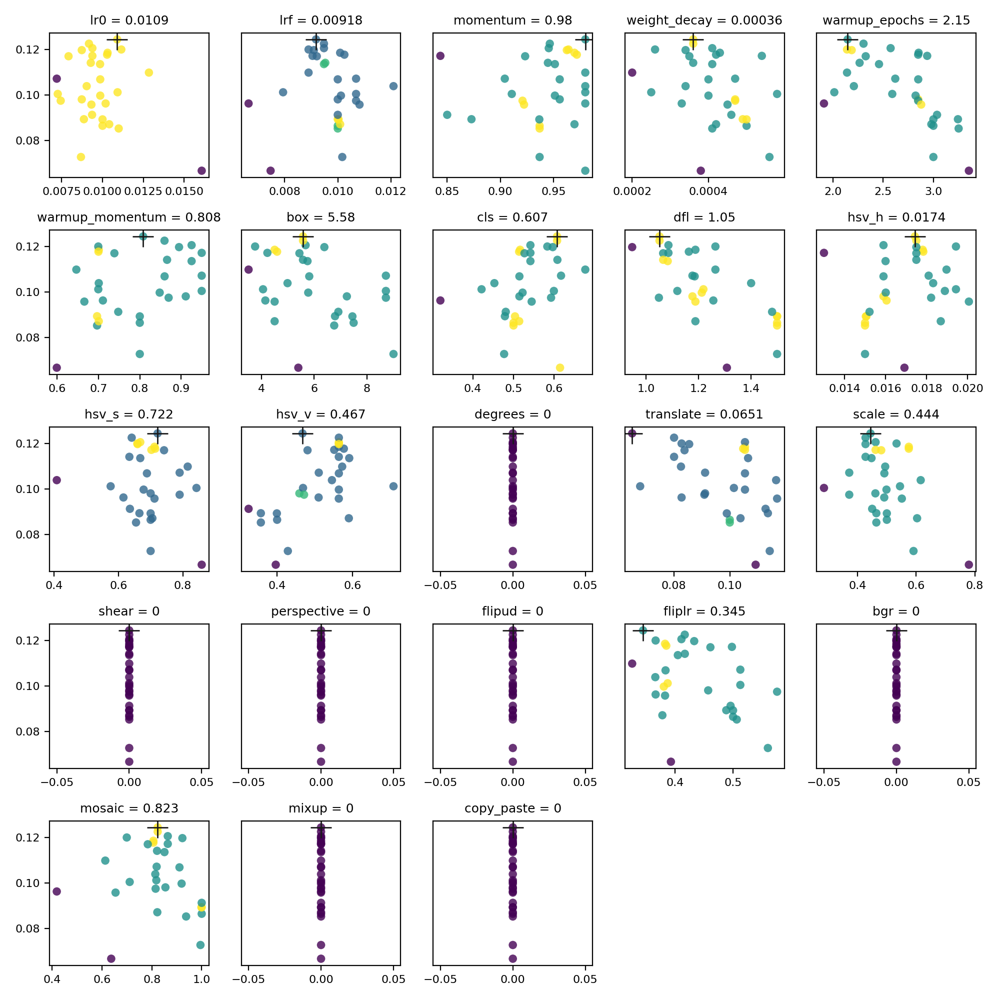

In [109]:
location = "./card/yolo12n_tune_v2"
ipd.display(ipd.Image(os.path.join(location, "tune_scatter_plots.png")))

## Инициализируем найденные гиперпараметры

In [112]:
location = "./card/yolo12n_tune_v2"
path_to_yaml = os.path.join(location, "best_hyperparameters.yaml")
with open(path_to_yaml, 'r') as f:
     augm = yaml.safe_load(f)

## Инициализируем модель

In [113]:
model = YOLO('yolo12n.pt')

## Обучаем модель

In [114]:
# Тренировка
result_train = model.train(data="./dataset/dataset.yaml",
                           batch=12,
                           imgsz=512,
                           save=True,
                           device=0,
                           project="card",
                           name="yolo12n_v5",
                           exist_ok=True,
                           optimizer="AdamW",
                           verbose=True,
                           seed=42,
                           val=True,
                           plots=True,
                           workers=0,
                           epochs=100,
                           resume=False,
                           augment=False,
                           amp=True,
                           **augm)

Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
WARNING ⚠️ Upgrade to torch>=2.0.0 for deterministic training.
engine/trainer: task=detect, mode=train, model=yolo12n.pt, data=./dataset/dataset.yaml, epochs=100, time=None, patience=100, batch=12, imgsz=512, save=True, save_period=-1, cache=False, device=0, workers=0, project=card, name=yolo12n_v5, exist_ok=True, pretrained=True, optimizer=AdamW, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, 

train: Scanning /home/student/projects/CVTools/AnotherExample/dataset/train/labels.cache... 852 images, 5 backgrounds, 0 c

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 cor

Plotting labels to card/yolo12n_v5/labels.jpg... 


optimizer: AdamW(lr=0.0109, momentum=0.98) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.0003375), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 0 dataloader workers
Logging results to card/yolo12n_v5
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      1.48G     0.8724      4.977     0.8048         54        512: 100%|██████████| 71/71 [00:12<00:00,  5.62i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      1.48G     0.6845      3.958     0.7502         54        512: 100%|██████████| 71/71 [00:11<00:00,  6.30i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      1.48G     0.6605      3.728     0.7553         56        512: 100%|██████████| 71/71 [00:11<00:00,  6.22i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:0

                   all        148        430          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      1.48G     0.6189      3.543     0.7273         69        512: 100%|██████████| 71/71 [00:11<00:00,  6.26i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0


                   all        148        430     0.0343      0.518     0.0488     0.0386

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      1.48G     0.5865       3.44     0.7073         56        512: 100%|██████████| 71/71 [00:11<00:00,  6.35i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430     0.0994      0.558     0.0549     0.0461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      1.48G     0.5748       3.32     0.7075         44        512: 100%|██████████| 71/71 [00:11<00:00,  6.39i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.165      0.457     0.0686     0.0569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      1.48G     0.5736      3.228      0.711         61        512: 100%|██████████| 71/71 [00:11<00:00,  6.36i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430        0.6      0.139      0.076     0.0648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      1.48G      0.569      3.163     0.7037         48        512: 100%|██████████| 71/71 [00:11<00:00,  6.37i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.263      0.288     0.0826     0.0708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      1.48G     0.5549      3.106     0.6997         56        512: 100%|██████████| 71/71 [00:11<00:00,  6.36i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.303      0.257      0.126      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      1.48G     0.5361       3.04     0.6911         53        512: 100%|██████████| 71/71 [00:11<00:00,  6.38i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.363      0.263      0.132      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      1.48G      0.529      2.998     0.6837         63        512: 100%|██████████| 71/71 [00:11<00:00,  6.41i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.202      0.266      0.109     0.0941



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      1.48G     0.5328      2.938     0.6903         48        512: 100%|██████████| 71/71 [00:10<00:00,  6.50i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.275      0.333      0.169      0.146



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      1.48G     0.5411      2.873     0.6879         47        512: 100%|██████████| 71/71 [00:10<00:00,  6.53i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.297      0.356      0.204      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      1.48G     0.5361      2.801     0.6867         56        512: 100%|██████████| 71/71 [00:10<00:00,  6.46i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.266      0.351      0.208      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      1.48G     0.5244       2.74     0.6812         62        512: 100%|██████████| 71/71 [00:11<00:00,  6.44i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.266      0.413      0.233      0.195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      1.48G     0.5103      2.685     0.6749         43        512: 100%|██████████| 71/71 [00:11<00:00,  6.29i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.285      0.293      0.239      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      1.48G     0.5136      2.614     0.6737         42        512: 100%|██████████| 71/71 [00:11<00:00,  6.37i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.478      0.288      0.233      0.201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      1.48G     0.5175       2.54     0.6739         63        512: 100%|██████████| 71/71 [00:11<00:00,  6.23i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.405      0.356      0.267      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      1.48G     0.5227      2.542     0.6826         61        512: 100%|██████████| 71/71 [00:11<00:00,  6.26i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.268      0.362      0.252      0.218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      1.48G     0.5157      2.461     0.6681         55        512: 100%|██████████| 71/71 [00:11<00:00,  6.19i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.368      0.366      0.299      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      1.48G     0.5079      2.395     0.6774         49        512: 100%|██████████| 71/71 [00:11<00:00,  6.25i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0


                   all        148        430       0.38      0.445      0.322      0.272

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      1.48G     0.5009      2.323     0.6687         42        512: 100%|██████████| 71/71 [00:11<00:00,  6.19i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.216      0.432      0.317       0.27



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      1.48G      0.501      2.254      0.669         43        512: 100%|██████████| 71/71 [00:11<00:00,  6.17i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.252      0.491       0.34      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      1.48G     0.5045      2.241     0.6742         50        512: 100%|██████████| 71/71 [00:11<00:00,  6.37i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.307      0.457      0.355      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      1.48G     0.4837      2.177     0.6572         53        512: 100%|██████████| 71/71 [00:11<00:00,  6.30i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.385       0.49      0.387      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      1.48G     0.4841      2.114     0.6555         74        512: 100%|██████████| 71/71 [00:11<00:00,  6.27i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.379      0.494      0.375      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      1.48G     0.4807      2.085     0.6594         60        512: 100%|██████████| 71/71 [00:11<00:00,  6.37i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.309      0.513      0.423      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      1.48G     0.4865      2.075     0.6643         49        512: 100%|██████████| 71/71 [00:11<00:00,  6.28i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0


                   all        148        430      0.296      0.621      0.425      0.367

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      1.48G     0.4907      2.018     0.6647         46        512: 100%|██████████| 71/71 [00:11<00:00,  6.35i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.281      0.542      0.397      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      1.48G     0.4942      1.984     0.6662         41        512: 100%|██████████| 71/71 [00:11<00:00,  6.31i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.438      0.556       0.48      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      1.48G     0.4901      1.917     0.6674         59        512: 100%|██████████| 71/71 [00:11<00:00,  6.22i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.399      0.601       0.49      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      1.48G     0.4807      1.863     0.6618         54        512: 100%|██████████| 71/71 [00:11<00:00,  6.34i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.353       0.51      0.463      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      1.48G     0.4789      1.863     0.6608         43        512: 100%|██████████| 71/71 [00:11<00:00,  6.26i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.396      0.597      0.529      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      1.48G     0.4871      1.843     0.6671         62        512: 100%|██████████| 71/71 [00:11<00:00,  6.30i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.482      0.602      0.564      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      1.48G      0.478      1.754     0.6547         45        512: 100%|██████████| 71/71 [00:11<00:00,  6.22i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.355      0.645      0.476      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      1.48G     0.4808      1.763     0.6591         69        512: 100%|██████████| 71/71 [00:11<00:00,  6.29i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.442      0.671      0.585       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      1.48G     0.4807      1.747     0.6646         50        512: 100%|██████████| 71/71 [00:11<00:00,  6.27i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430       0.42      0.604      0.565      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      1.48G     0.4645      1.691      0.653         54        512: 100%|██████████| 71/71 [00:11<00:00,  6.38i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.432      0.658      0.615      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      1.48G     0.4607      1.614     0.6454         49        512: 100%|██████████| 71/71 [00:11<00:00,  6.33i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.441      0.691      0.612      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      1.48G     0.4743      1.628     0.6567         40        512: 100%|██████████| 71/71 [00:11<00:00,  6.35i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.508      0.656       0.65      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      1.48G     0.4717      1.591     0.6554         59        512: 100%|██████████| 71/71 [00:11<00:00,  6.32i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.494      0.679      0.673      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      1.48G     0.4633      1.494     0.6518         55        512: 100%|██████████| 71/71 [00:11<00:00,  6.39i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.488      0.737      0.652      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      1.48G     0.4603      1.497     0.6504         37        512: 100%|██████████| 71/71 [00:11<00:00,  6.31i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.511      0.747      0.686      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      1.48G      0.457       1.43     0.6474         44        512: 100%|██████████| 71/71 [00:11<00:00,  6.38i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.597      0.755      0.747       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      1.48G     0.4674      1.433     0.6522         51        512: 100%|██████████| 71/71 [00:11<00:00,  6.31i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.413      0.727       0.62      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      1.48G     0.4603      1.385     0.6556         61        512: 100%|██████████| 71/71 [00:11<00:00,  6.23i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.578       0.72      0.771      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      1.48G      0.456      1.346      0.653         65        512: 100%|██████████| 71/71 [00:11<00:00,  6.37i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.533      0.784      0.764      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      1.48G     0.4666      1.345     0.6551         66        512: 100%|██████████| 71/71 [00:11<00:00,  6.32i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.615      0.716      0.784      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      1.48G     0.4526      1.302     0.6453         43        512: 100%|██████████| 71/71 [00:11<00:00,  6.38i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.652      0.719       0.79      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      1.48G     0.4627       1.32     0.6532         53        512: 100%|██████████| 71/71 [00:11<00:00,  6.33i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.613      0.831      0.825      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      1.48G     0.4503      1.238     0.6442         50        512: 100%|██████████| 71/71 [00:11<00:00,  6.37i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.685      0.695      0.791       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      1.48G     0.4584      1.239     0.6555         53        512: 100%|██████████| 71/71 [00:11<00:00,  6.36i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.575      0.824      0.832      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      1.48G     0.4531      1.177     0.6478         68        512: 100%|██████████| 71/71 [00:11<00:00,  6.29i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.678      0.781      0.842       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      1.48G     0.4499      1.192       0.65         57        512: 100%|██████████| 71/71 [00:11<00:00,  6.28i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.608      0.781       0.82      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      1.48G     0.4408      1.154     0.6445         60        512: 100%|██████████| 71/71 [00:11<00:00,  6.07i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.699      0.779      0.851      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      1.48G     0.4527      1.171     0.6437         63        512: 100%|██████████| 71/71 [00:11<00:00,  6.23i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.642      0.848      0.822      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      1.48G     0.4429      1.117     0.6435         41        512: 100%|██████████| 71/71 [00:11<00:00,  6.35i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.699      0.864      0.862      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      1.48G     0.4484      1.087     0.6467         51        512: 100%|██████████| 71/71 [00:11<00:00,  6.33i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.723      0.807      0.877      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      1.48G     0.4461      1.094     0.6444         54        512: 100%|██████████| 71/71 [00:12<00:00,  5.75i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.722       0.84      0.879      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      1.48G     0.4483      1.074     0.6419         40        512: 100%|██████████| 71/71 [00:11<00:00,  6.07i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.726      0.741      0.847      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      1.48G     0.4403      1.065     0.6412         43        512: 100%|██████████| 71/71 [00:11<00:00,  6.29i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.767      0.857      0.917      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      1.48G     0.4361      1.019     0.6355         37        512: 100%|██████████| 71/71 [00:11<00:00,  6.18i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.721      0.909      0.907      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      1.48G     0.4461     0.9868     0.6437         65        512: 100%|██████████| 71/71 [00:11<00:00,  6.18i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.678      0.919      0.887      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      1.48G     0.4428     0.9986     0.6386         64        512: 100%|██████████| 71/71 [00:11<00:00,  6.23i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430       0.77      0.909      0.923      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      1.48G     0.4391     0.9897     0.6403         54        512: 100%|██████████| 71/71 [00:11<00:00,  6.23i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.704      0.882        0.9       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      1.48G     0.4296     0.9575     0.6338         55        512: 100%|██████████| 71/71 [00:11<00:00,  6.29i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.798      0.913      0.945      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      1.48G     0.4339     0.9194     0.6386         60        512: 100%|██████████| 71/71 [00:11<00:00,  6.37i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.824      0.917       0.95      0.845



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      1.48G     0.4361     0.9289     0.6398         60        512: 100%|██████████| 71/71 [00:11<00:00,  6.20i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.821      0.879      0.938      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      1.48G     0.4307     0.8994     0.6352         68        512: 100%|██████████| 71/71 [00:12<00:00,  5.81i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.869      0.913       0.96      0.845



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      1.48G      0.434     0.9144     0.6309         53        512: 100%|██████████| 71/71 [00:11<00:00,  6.05i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.812      0.952      0.958      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      1.48G     0.4342     0.8497     0.6349         58        512: 100%|██████████| 71/71 [00:11<00:00,  6.32i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.767      0.929      0.947      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      1.48G     0.4392     0.8873     0.6341         42        512: 100%|██████████| 71/71 [00:11<00:00,  6.22i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.889      0.842      0.947      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      1.48G     0.4244     0.8346     0.6365         57        512: 100%|██████████| 71/71 [00:11<00:00,  6.27i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.884       0.94       0.98      0.864



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      1.48G     0.4316     0.8336     0.6367         64        512: 100%|██████████| 71/71 [00:11<00:00,  6.43i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.905       0.96      0.975      0.865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      1.48G      0.429     0.8349     0.6314         51        512: 100%|██████████| 71/71 [00:11<00:00,  6.35i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.839      0.917      0.946      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      1.48G     0.4248     0.8193     0.6327         53        512: 100%|██████████| 71/71 [00:11<00:00,  6.34i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.864      0.965      0.979      0.867



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      1.48G     0.4339     0.8066     0.6358         60        512: 100%|██████████| 71/71 [00:11<00:00,  6.24i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.899      0.931      0.979      0.867



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      1.48G     0.4389     0.8532      0.641         73        512: 100%|██████████| 71/71 [00:11<00:00,  6.04i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.926      0.966      0.984      0.878



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      1.48G     0.4283     0.8068     0.6316         37        512: 100%|██████████| 71/71 [00:11<00:00,  6.30i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.914      0.958      0.982      0.876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      1.48G     0.4215     0.7822     0.6296         55        512: 100%|██████████| 71/71 [00:11<00:00,  6.26i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0


                   all        148        430      0.929      0.965      0.989      0.879

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      1.48G     0.4191      0.769     0.6353         67        512: 100%|██████████| 71/71 [00:11<00:00,  6.31i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.897      0.947      0.971      0.858



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      1.48G     0.4203     0.7604     0.6307         61        512: 100%|██████████| 71/71 [00:11<00:00,  6.34i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.925      0.971       0.99      0.878



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      1.48G     0.4211     0.7411     0.6334         54        512: 100%|██████████| 71/71 [00:11<00:00,  6.33i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.922      0.965      0.985      0.872



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      1.48G     0.4234     0.7643     0.6298         52        512: 100%|██████████| 71/71 [00:11<00:00,  6.35i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.903      0.957      0.975      0.862



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      1.48G     0.4165     0.7143     0.6262         59        512: 100%|██████████| 71/71 [00:11<00:00,  6.16i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.927      0.964      0.981      0.872



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      1.48G     0.4096     0.7291     0.6272         58        512: 100%|██████████| 71/71 [00:11<00:00,  6.39i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.951      0.968       0.99      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      1.48G     0.4145     0.7075      0.629         68        512: 100%|██████████| 71/71 [00:11<00:00,  6.22i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.925      0.976      0.985      0.879



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      1.48G     0.4115     0.7249     0.6283         57        512: 100%|██████████| 71/71 [00:11<00:00,  6.21i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.951      0.983      0.994      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      1.48G     0.4093     0.6874     0.6321         47        512: 100%|██████████| 71/71 [00:11<00:00,  6.14i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.959      0.963      0.989      0.878



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      1.48G     0.4134     0.7121     0.6302         71        512: 100%|██████████| 71/71 [00:11<00:00,  6.19i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.936      0.983      0.992      0.881


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      1.48G     0.3981     0.5214     0.6362         31        512: 100%|██████████| 71/71 [00:11<00:00,  6.39i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.949      0.987      0.993      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      1.48G     0.3932     0.4894     0.6331         27        512: 100%|██████████| 71/71 [00:10<00:00,  6.46i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.938      0.985       0.99       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      1.48G     0.3886     0.4917     0.6328         34        512: 100%|██████████| 71/71 [00:10<00:00,  6.51i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.956      0.986      0.994      0.888



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      1.48G      0.384     0.4854     0.6311         29        512: 100%|██████████| 71/71 [00:11<00:00,  6.35i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430       0.94      0.996      0.994      0.887



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      1.48G     0.3872     0.4735     0.6326         34        512: 100%|██████████| 71/71 [00:10<00:00,  6.50i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.952      0.988      0.994       0.89



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      1.48G     0.3827     0.4592      0.626         38        512: 100%|██████████| 71/71 [00:10<00:00,  6.57i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.963      0.985      0.994       0.89



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      1.48G     0.3825     0.4589     0.6341         37        512: 100%|██████████| 71/71 [00:10<00:00,  6.54i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.963      0.995      0.994      0.889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      1.48G     0.3828     0.4452     0.6314         36        512: 100%|██████████| 71/71 [00:10<00:00,  6.61i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.949      0.988      0.994      0.889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      1.48G     0.3798     0.4623     0.6265         43        512: 100%|██████████| 71/71 [00:10<00:00,  6.49i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.959      0.987      0.994      0.891



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      1.48G     0.3776     0.4416     0.6219         26        512: 100%|██████████| 71/71 [00:11<00:00,  6.38i
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:0

                   all        148        430      0.964       0.99      0.994      0.891



100 epochs completed in 0.343 hours.
Optimizer stripped from card/yolo12n_v5/weights/last.pt, 5.5MB
Optimizer stripped from card/yolo12n_v5/weights/best.pt, 5.5MB

Validating card/yolo12n_v5/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:0


                   all        148        430      0.964       0.99      0.994      0.892
                   10c         17         17      0.978          1      0.995      0.897
                   10d          5          5      0.953          1      0.995      0.889
                   10h          7          7      0.945          1      0.995      0.926
                   10s          1          1      0.834          1      0.995      0.995
                    2c          4          4      0.945          1      0.995      0.895
                    2d         12         12      0.984          1      0.995      0.887
                    2h          5          5      0.913          1      0.995      0.916
                    2s         11         11      0.977          1      0.995      0.907
                    3c          8          8      0.989          1      0.995      0.875
                    3d          8          8      0.967          1      0.995      0.855
                    3

## Инициализации модели с лучшим чекпоинтом

In [115]:
model = YOLO(r'./card/yolo12n_v5/weights/best.pt')

## Вычисляем метрики на тестовых данных

In [116]:
results_val = model.val(source="./dataset/test/images/",
                        device=0,
                        imgsz=512,
                        save=True,
                        conf=0.5,
                        iou=0.5,
                        show_labels=True,
                        augment=False)

Ultralytics 8.3.104 🚀 Python-3.10.12 torch-1.12.1+cu116 CUDA:0 (NVIDIA A100 80GB PCIe, 81051MiB)
YOLOv12n summary (fused): 159 layers, 2,566,868 parameters, 0 gradients, 6.4 GFLOPs


val: Scanning /home/student/projects/CVTools/AnotherExample/dataset/valid/labels.cache... 148 images, 0 backgrounds, 0 cor
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00


                   all        148        430      0.999      0.999      0.994      0.906
                   10c         17         17          1          1      0.995      0.906
                   10d          5          5          1          1      0.995      0.902
                   10h          7          7          1          1      0.995      0.936
                   10s          1          1          1          1      0.995      0.995
                    2c          4          4          1          1      0.995      0.895
                    2d         12         12          1          1      0.995      0.908
                    2h          5          5          1          1      0.995      0.923
                    2s         11         11          1          1      0.995      0.906
                    3c          8          8          1          1      0.995       0.88
                    3d          8          8          1          1      0.995      0.857
                    3

## Инференс моделью

In [117]:
result_inf = model.predict(source="./dataset/test/images/",
                           device=0,
                           imgsz=512,
                           save=True,
                           conf=0.5,
                           iou=0.5,
                           show_labels=True,
                           augment=False)


image 1/74 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_dfjiresdf_png.rf.c38b75e834f1a56809fd2fe5f0e6b7c3.jpg: 160x512 1 2d, 1 3d, 1 5d, 1 5s, 12.2ms
image 2/74 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_dj8jw8jhfw83_png_jpg.rf.0a9e13522f827ac13565c7adea5feac0.jpg: 512x512 1 Js, 1 Kc, 1 Qc, 13.3ms
image 3/74 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_dj8jw8jhfw83_png_jpg.rf.483aff50b8135870bae9090e5744193e.jpg: 512x512 1 Js, 1 Kc, 1 Qc, 12.6ms
image 4/74 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_dskck93jwd93j_png_jpg.rf.1cc0e83538e1ce49907ff2a003123b23.jpg: 512x512 1 3h, 1 5h, 1 8c, 1 Ah, 1 Kd, 12.4ms
image 5/74 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_dufy783hsuher3_png_jpg.rf.35f4b7126bca739b6f98833d252b7ec9.jpg: 512x512 1 10h, 1 2s, 1 Qs, 12.6ms
image 6/74 /home/student/projects/CVTools/AnotherExample/dataset/test/images/board_dufy783hsuh

## Визуализируем графики

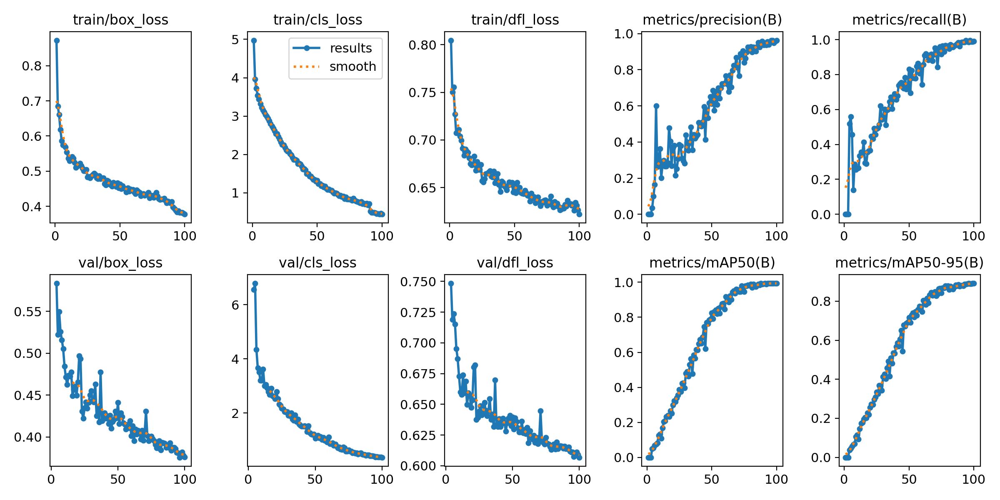

In [118]:
location = "./card/yolo12n_v5"
ipd.display(ipd.Image(os.path.join(location, "results.png")))

## Визуализируем результат предсказаний


0: 512x512 1 Jd, 1 Jh, 12.7ms
Speed: 1.3ms preprocess, 12.7ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


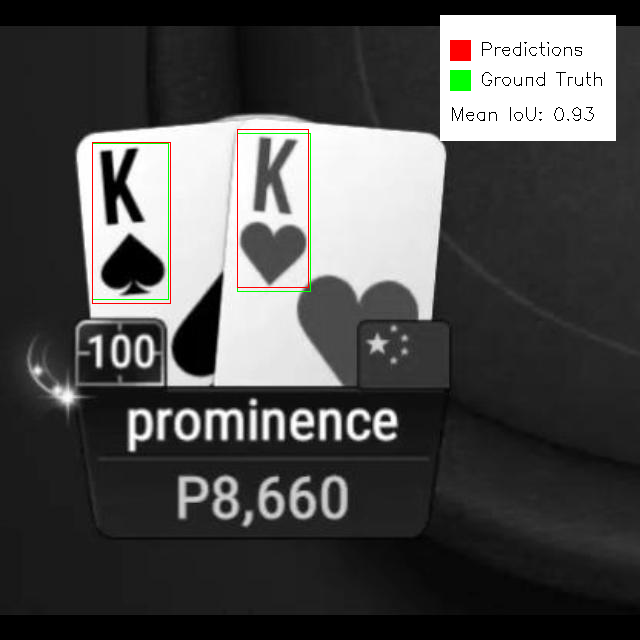

In [119]:
# Визуализируем результат предсказания
display_pred_and_ground(
    "./dataset",
    "./card/yolo12n_v5/weights/best.pt",
    12
)

# Функция для инференса карт

In [142]:
import cv2
import numpy as np
import os

def detect_poker_cards(
    model, 
    image_path, 
    hero_coords, 
    board_coords, 
    visualize=False,
    device=0,
    imgsz=512,
    conf=0.5,
    iou=0.5,
    show_labels=True,
    augment=False,
    save=False,
    output_dir="./output"
):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Image not found at {image_path}")
    
    if save:
        os.makedirs(output_dir, exist_ok=True)
        base_name = os.path.splitext(os.path.basename(image_path))[0]
    
    img_height, img_width = image.shape[:2]
    output_image = image.copy()
    
    def process_region(coords, region_name, predict_params, save_image=False):
        x1_rel, y1_rel = coords[0]
        x2_rel, y2_rel = coords[1]
        x1 = int(min(x1_rel, x2_rel) * img_width)
        x2 = int(max(x1_rel, x2_rel) * img_width)
        y1 = int(min(y1_rel, y2_rel) * img_height)
        y2 = int(max(y1_rel, y2_rel) * img_height)
        x1, y1 = max(0, x1), max(0, y1)
        x2, y2 = min(img_width, x2), min(img_height, y2)
        
        roi = image[y1:y2, x1:x2]
        roi_rgb = cv2.cvtColor(roi, cv2.COLOR_BGR2RGB)
        
        # Создаем копию для сохранения/визуализации
        vis_roi = roi.copy()
        
        results = model.predict(
            source=roi_rgb,
            **predict_params
        )
        
        cards = []
        if results and len(results[0].boxes) > 0:
            boxes = results[0].boxes.xyxy.cpu().numpy()
            classes = results[0].boxes.cls.cpu().numpy().astype(int)
            confidences = results[0].boxes.conf.cpu().numpy()
            
            detections = []
            for i in range(len(classes)):
                if confidences[i] >= predict_params['conf']:
                    detections.append((boxes[i], classes[i], confidences[i]))
            
            detections.sort(key=lambda x: x[0][0])
            
            for box, cls, conf in detections:
                cards.append(model.names[cls])
                box = box.astype(int)
                cv2.rectangle(vis_roi, 
                            (box[0], box[1]), 
                            (box[2], box[3]), 
                            (255, 0, 0), 2)
                cv2.putText(vis_roi, 
                           f"{model.names[cls]} {conf:.2f}", 
                           (box[0], box[1] - 5), 
                           cv2.FONT_HERSHEY_SIMPLEX, 
                           0.6, (255, 255, 0), 2)
                
                if visualize or save_image:
                    cv2.rectangle(output_image, 
                                (x1 + box[0], y1 + box[1]), 
                                (x1 + box[2], y1 + box[3]), 
                                (255, 0, 0), 2)
                    cv2.putText(output_image, 
                               f"{model.names[cls]} {conf:.2f}", 
                               (x1 + box[0], y1 + box[1] - 5), 
                               cv2.FONT_HERSHEY_SIMPLEX, 
                               0.6, (255, 255, 0), 2)
        
        if save_image:
            region_output_dir = os.path.join(output_dir, region_name)
            os.makedirs(region_output_dir, exist_ok=True)
            output_path = os.path.join(region_output_dir, f"{base_name}_{region_name}.jpg")
            cv2.imwrite(output_path, vis_roi)
        
        return cards
    
    predict_params = {
        'device': device,
        'imgsz': imgsz,
        'conf': conf,
        'iou': iou,
        'show_labels': show_labels,
        'augment': augment,
        'save': False  # Мы сами сохраняем результаты
    }
    
    hero_cards = process_region(hero_coords, "hero_hand", predict_params, save)
    board_cards = process_region(board_coords, "board", predict_params, save)
    
    if save:
        # Сохраняем полное изображение с детекциями
        full_output_path = os.path.join(output_dir, f"{base_name}_full.jpg")
        cv2.imwrite(full_output_path, output_image)
    
    if visualize:
        cv2.imshow("Detection Results", output_image)
        cv2.waitKey(0)
        cv2.destroyAllWindows()
    
    return {
        'hero_hand': hero_cards,
        'board': board_cards
    }

In [146]:
# Пример вызова:
path_to_samples = "ПУТЬ К ПАПКЕ С КАРТИНКАМИ"
model = YOLO(r'ПУТЬ К ВЕСАМ МОДЕЛИ')
list_paths = [os.path.join(path_to_samples, f) for f in os.listdir(path_to_samples) 
              if os.path.isfile(os.path.join(path_to_samples, f))]

for path in list_paths:
    result = detect_poker_cards(
        model=model,
        image_path=path,
        hero_coords=[[0.4, 0.7], [0.6, 0.9]],
        board_coords=[[0.25, 0.3], [0.75, 0.6]],
        visualize=False,
        device='cuda:0',
        conf=0.5,
        iou=0.5,
        augment=True,
        save=True
    )

    print(result)


0: 320x512 1 10d, 1 Ac, 35.4ms
Speed: 1.2ms preprocess, 35.4ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 512)

0: 192x512 1 7s, 1 Ad, 1 As, 1 Jc, 1 Kc, 1 Qc, 45.7ms
Speed: 0.7ms preprocess, 45.7ms inference, 0.8ms postprocess per image at shape (1, 3, 192, 512)
{'hero_hand': ['Ac', '10d'], 'board': ['Kc', 'As', '7s', 'Jc', 'Ad', 'Qc']}

0: 320x512 1 10d, 1 Ac, 35.9ms
Speed: 0.7ms preprocess, 35.9ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 512)

0: 192x512 (no detections), 34.7ms
Speed: 0.7ms preprocess, 34.7ms inference, 0.3ms postprocess per image at shape (1, 3, 192, 512)
{'hero_hand': ['Ac', '10d'], 'board': []}

0: 320x512 1 10d, 1 Ac, 35.9ms
Speed: 0.6ms preprocess, 35.9ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 512)

0: 192x512 1 7s, 1 As, 1 Jc, 1 Kc, 34.8ms
Speed: 0.7ms preprocess, 34.8ms inference, 0.8ms postprocess per image at shape (1, 3, 192, 512)
{'hero_hand': ['Ac', '10d'], 'board': ['Kc', 'As', '7s', 'Jc']}

0: 32

# Выводы

<hr style="border: 1px solid rgba(50, 50, 255, 0.5); width: 100%;">

<pre style="background-color: #888888; padding: 10px; border-radius: 5px; font-family: monospace;">
    <span style="color: white;">
        Натюнились, можно и поспать...
    </span>
</pre>

<hr style="border: 1px solid rgba(50, 50, 255, 0.5); width: 100%;">